# Neural Ordinary Differential Equations

In models such as residual networks, hidden states from $t$ to $t+1$ are transformed by a series of discrete transformations:

$$\textbf{h}_{t+1}=\textbf{h}_{t}+f(\textbf{h}_{t},\theta_{t})$$

where $\textbf{h}_{t}\in \mathbb{R}^{D}$ and $t\in \left\{0\ldots T \right\}$.

We can interpret the difference $\textbf{h}_{t+1}-\textbf{h}_{t}$ as a discretization of the derivative $\textbf{h}'(t)$ with step size $\Delta t=1$. At the limit $\Delta t\to 0$, we have

$$\lim_{\Delta t \to 0} \frac{\textbf{h}_{t+\Delta t}-\textbf{h}_{t}}{\Delta t}=\frac{d \textbf{h}(t)}{dt}=f(\textbf{h}(t),t,\theta)$$

such that we can represent the continuous dynamics of hidden states using an ordinary differential equation (ODE) specified by some neural network with parameters $\theta$. We can map input layer $\textbf{h}(0)$ to output layer $\textbf{h}(T)$ by solving the ODE initial value problem to some time $T$.



### Initial value problem

Given our ODE:

$$\frac{d\textbf{z}(t)}{dt}=f(\textbf{z}(t),t,\theta)$$

We start with $\textbf{z}(t_{0})$ and we can solve for the next hidden state $\textbf{z}(t_{1})$:

$$\textbf{z}(t_{1})=\textbf{z}(t_{0})+\int_{t_{0}}^{t_{1}}f(\textbf{z}(t),t,\theta)dt$$

If the integral cannot be solved analytically, we can also use an ODE solver to compute $\textbf{z}(t_{1})$ numerically. This is equivalent to performing a forward propagation in our neural ODE:

$$\textbf{z}(t_{1})=\text{ODESolve}(\textbf{z}(t_{0}),f,t_{0},t_{1},\theta)$$

To train neural ODE, we need to compute gradients with respect to the parameters for the loss function:

$$L(\textbf{z}(t_{1}))=L\Big(\textbf{z}(t_{0})+\int_{t_{0}}^{t_{1}}f(\textbf{z}(t),t,\theta)dt\Big)=L(\text{ODESolve}(\textbf{z}(t_{0}),f,t_{0},t_{1},\theta))$$

Backpropagating through the ODE solver incurs high memory cost by saving all activations of all iterations of ODESolve. Using the adjoint sensitivity method, a secondary ODE is solved backwards in time. The gradients of the loss function are calculated altogether during a single call of the ODESolve with augmented state dynamics.

### Experimenting with generative latent function time-series model

![Figure from paper](https://i.ibb.co/WgF2D03/1.png)

![Algorithm from paper](https://i.ibb.co/7r40McL/2.png)

### Steps:

1. Encode the observed data using RNN into a latent distribution (e.g. Gaussian)
2. Sample from the latent distribution
3. Use the sample as initial value to neural ODE and solve for latent points in later time steps
4. Decode the latent points and compute loss by maximizing ELBO
5. We can perform extrapolation by solving neural ODE for latent points in future time steps

In [ ]:
!pip install git+https://github.com/rtqichen/torchdiffeq

In [1]:
import os
import numpy as np
import numpy.random as npr
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim

In [3]:
def generate_spiral2d(nspiral=1000,
                      ntotal=500,
                      nsample=100,
                      start=0.,
                      stop=1,  # approximately equal to 6pi
                      noise_std=.1,
                      a=0.,
                      b=1.,
                      savefig=True):
    """Parametric formula for 2d spiral is `r = a + b * theta`.
    Args:
      nspiral: number of spirals, i.e. batch dimension
      ntotal: total number of datapoints per spiral
      nsample: number of sampled datapoints for model fitting per spiral
      start: spiral starting theta value
      stop: spiral ending theta value
      noise_std: observation noise standard deviation
      a, b: parameters of the Archimedean spiral
      savefig: plot the ground truth for sanity check
    Returns: 
      Tuple where first element is true trajectory of size (nspiral, ntotal, 2),
      second element is noisy observations of size (nspiral, nsample, 2),
      third element is timestamps of size (ntotal,),
      and fourth element is timestamps of size (nsample,)
    """

    # add 1 all timestamps to avoid division by 0
    orig_ts = np.linspace(start, stop, num=ntotal)
    samp_ts = orig_ts[:nsample]

    # generate clock-wise and counter clock-wise spirals in observation space
    # with two sets of time-invariant latent dynamics
    zs_cw = stop + 1. - orig_ts
    rs_cw = a + b * 50. / zs_cw
    xs, ys = rs_cw * np.cos(zs_cw) - 5., rs_cw * np.sin(zs_cw)
    orig_traj_cw = np.stack((xs, ys), axis=1)

    zs_cc = orig_ts
    rw_cc = a + b * zs_cc
    xs, ys = rw_cc * np.cos(zs_cc) + 5., rw_cc * np.sin(zs_cc)
    orig_traj_cc = np.stack((xs, ys), axis=1)

    if savefig:
        plt.figure()
        plt.plot(orig_traj_cw[:, 0], orig_traj_cw[:, 1], label='clock')
        plt.plot(orig_traj_cc[:, 0], orig_traj_cc[:, 1], label='counter clock')
        plt.legend()
        plt.show()

    # sample starting timestamps
    orig_trajs = []
    samp_trajs = []
    for _ in range(nspiral):
        # don't sample t0 very near the start or the end
        t0_idx = npr.multinomial(
            1, [1. / (ntotal - 2. * nsample)] * (ntotal - int(2 * nsample)))
        t0_idx = np.argmax(t0_idx) + nsample

        cc = bool(npr.rand() > .5)  # uniformly select rotation
        orig_traj = orig_traj_cc if cc else orig_traj_cw
        orig_trajs.append(orig_traj)

        samp_traj = orig_traj[t0_idx:t0_idx + nsample, :].copy()
        samp_traj += npr.randn(*samp_traj.shape) * noise_std
        samp_trajs.append(samp_traj)

    # batching for sample trajectories is good for RNN; batching for original
    # trajectories only for ease of indexing
    orig_trajs = np.stack(orig_trajs, axis=0)
    samp_trajs = np.stack(samp_trajs, axis=0)

    return orig_trajs, samp_trajs, orig_ts, samp_ts

In [4]:
class LatentODEfunc(nn.Module):

    def __init__(self, latent_dim=4, nhidden=20):
        super(LatentODEfunc, self).__init__()
        self.elu = nn.ELU(inplace=True)
        self.fc1 = nn.Linear(latent_dim, nhidden)
        self.fc2 = nn.Linear(nhidden, nhidden)
        self.fc3 = nn.Linear(nhidden, latent_dim)
        self.nfe = 0

    def forward(self, t, x):
        self.nfe += 1
        out = self.fc1(x)
        out = self.elu(out)
        out = self.fc2(out)
        out = self.elu(out)
        out = self.fc3(out)
        return out


class RecognitionRNN(nn.Module):

    def __init__(self, latent_dim=4, obs_dim=2, nhidden=25, nbatch=1):
        super(RecognitionRNN, self).__init__()
        self.nhidden = nhidden
        self.nbatch = nbatch
        self.i2h = nn.Linear(obs_dim + nhidden, nhidden)
        self.h2o = nn.Linear(nhidden, latent_dim * 2)

    def forward(self, x, h):
        combined = torch.cat((x, h), dim=1)
        h = torch.tanh(self.i2h(combined))
        out = self.h2o(h)
        return out, h

    def initHidden(self):
        return torch.zeros(self.nbatch, self.nhidden)


class Decoder(nn.Module):

    def __init__(self, latent_dim=4, obs_dim=2, nhidden=20):
        super(Decoder, self).__init__()
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(latent_dim, nhidden)
        self.fc2 = nn.Linear(nhidden, obs_dim)

    def forward(self, z):
        out = self.fc1(z)
        out = self.relu(out)
        out = self.fc2(out)
        return out


class RunningAverageMeter(object):
    """Computes and stores the average and current value"""

    def __init__(self, momentum=0.99):
        self.momentum = momentum
        self.reset()

    def reset(self):
        self.val = None
        self.avg = 0

    def update(self, val):
        if self.val is None:
            self.avg = val
        else:
            self.avg = self.avg * self.momentum + val * (1 - self.momentum)
        self.val = val


def log_normal_pdf(x, mean, logvar):
    const = torch.from_numpy(np.array([2. * np.pi])).float().to(x.device)
    const = torch.log(const)
    return -.5 * (const + logvar + (x - mean) ** 2. / torch.exp(logvar))


def normal_kl(mu1, lv1, mu2, lv2):
    v1 = torch.exp(lv1)
    v2 = torch.exp(lv2)
    lstd1 = lv1 / 2.
    lstd2 = lv2 / 2.

    kl = lstd2 - lstd1 + ((v1 + (mu1 - mu2) ** 2.) / (2. * v2)) - .5
    return kl

### Experimenting with non-adjoint backpropagation

The non-adjoint method incurs a high memory cost and introduces additional numerical error for more complex problems.

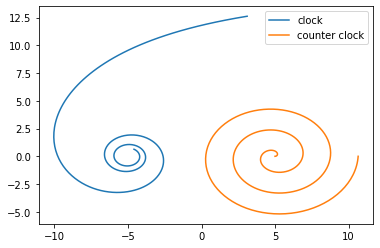

Iter: 10, running avg elbo: -19204.7336


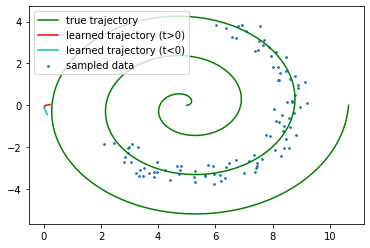

Iter: 20, running avg elbo: -19111.5066


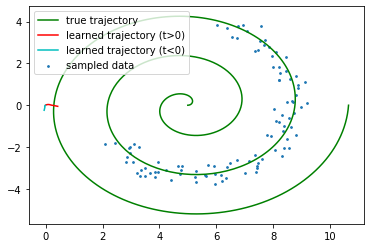

Iter: 30, running avg elbo: -18876.3026


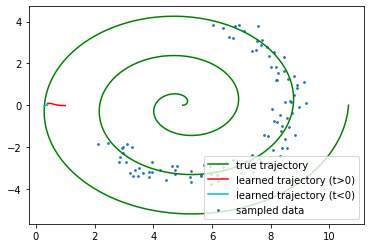

Iter: 40, running avg elbo: -18418.8572


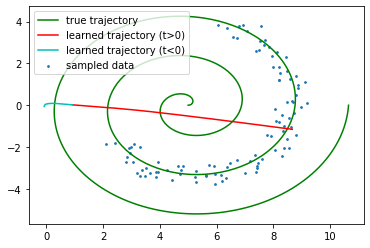

Iter: 50, running avg elbo: -17732.1848


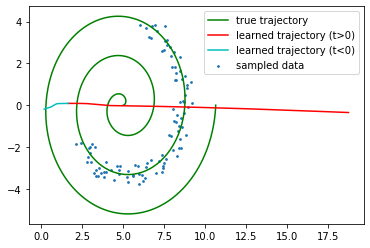

Iter: 60, running avg elbo: -16898.1705


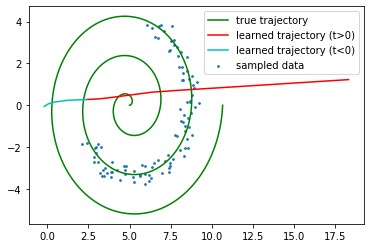

Iter: 70, running avg elbo: -16003.4675


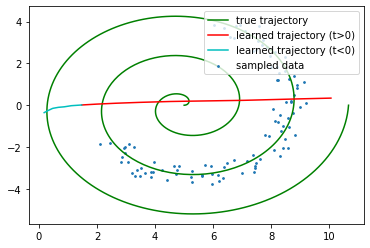

Iter: 80, running avg elbo: -15154.7384


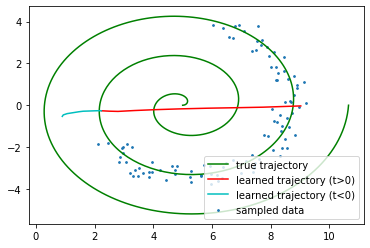

Iter: 90, running avg elbo: -14353.5106


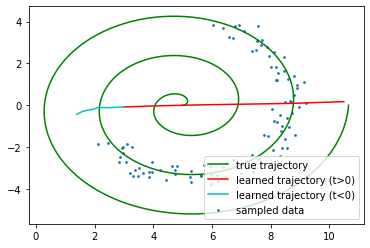

Iter: 100, running avg elbo: -13599.8602


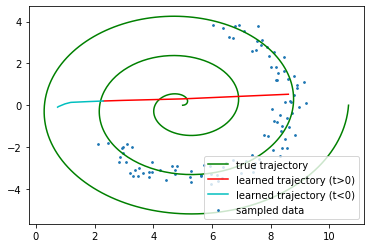

Iter: 110, running avg elbo: -12894.9287


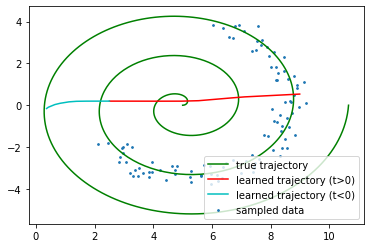

Iter: 120, running avg elbo: -12235.9759


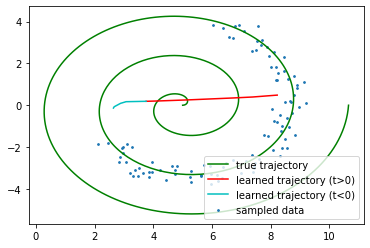

Iter: 130, running avg elbo: -11622.5697


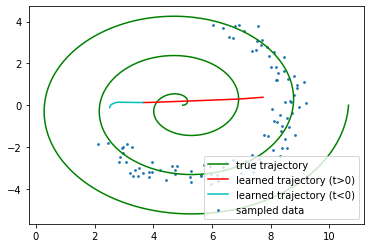

Iter: 140, running avg elbo: -11051.4283


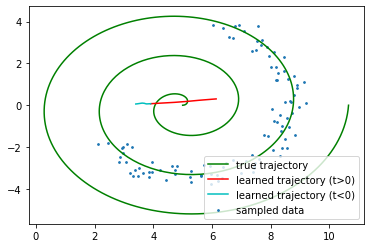

Iter: 150, running avg elbo: -10523.8979


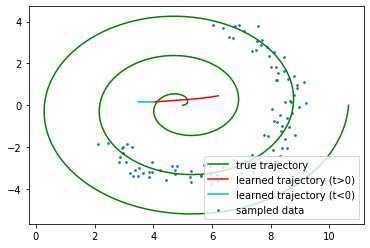

Iter: 160, running avg elbo: -10036.0807


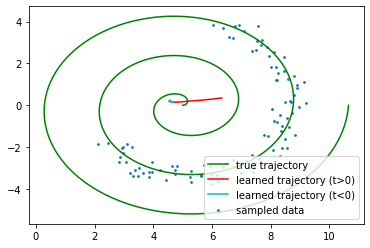

Iter: 170, running avg elbo: -9586.7464


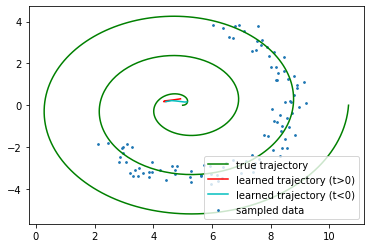

Iter: 180, running avg elbo: -9173.9220


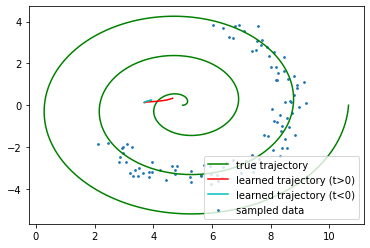

Iter: 190, running avg elbo: -8798.6801


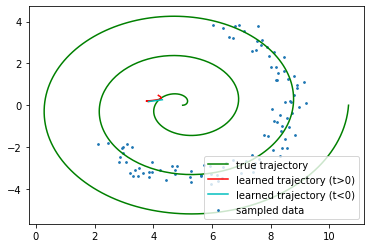

Iter: 200, running avg elbo: -8455.7911


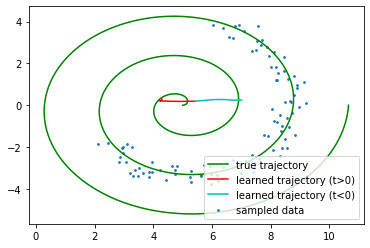

Iter: 210, running avg elbo: -8145.2052


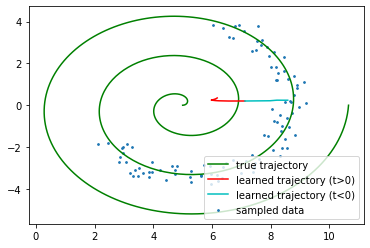

Iter: 220, running avg elbo: -7860.8265


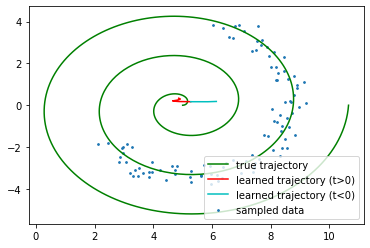

Iter: 230, running avg elbo: -7600.9981


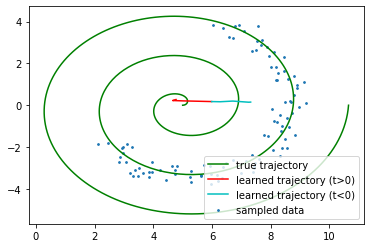

Iter: 240, running avg elbo: -7362.5459


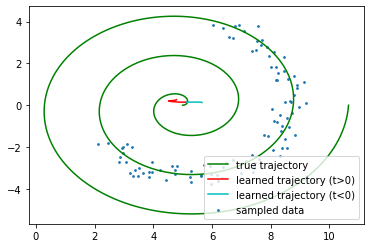

Iter: 250, running avg elbo: -7142.9541


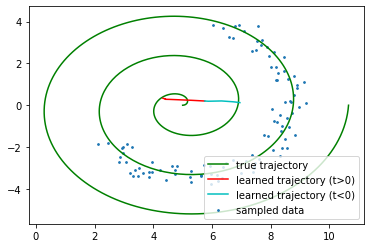

Iter: 260, running avg elbo: -6939.7068


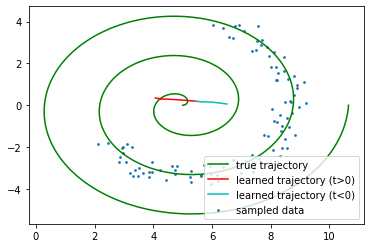

Iter: 270, running avg elbo: -6750.2579


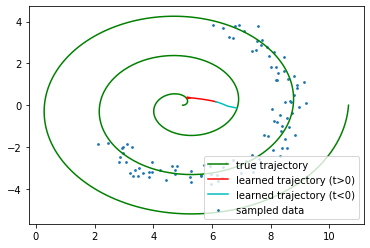

Iter: 280, running avg elbo: -6575.5737


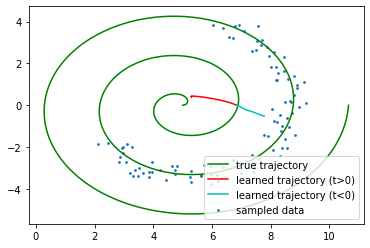

Iter: 290, running avg elbo: -6412.9058


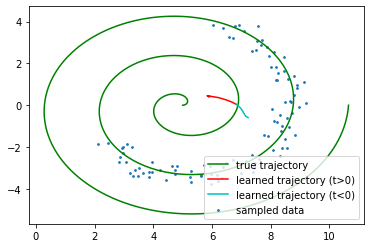

Iter: 300, running avg elbo: -6260.8514


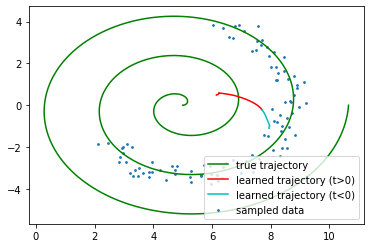

Iter: 310, running avg elbo: -6120.9187


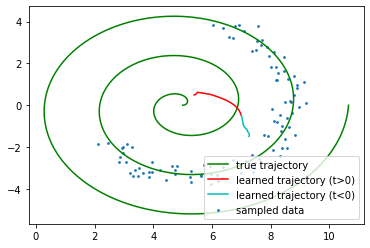

Iter: 320, running avg elbo: -5990.9764


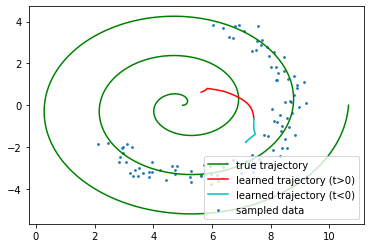

Iter: 330, running avg elbo: -5869.7369


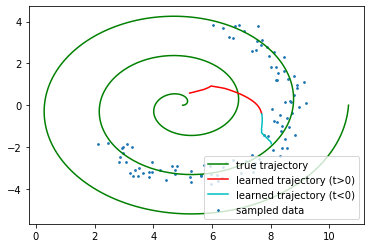

Iter: 340, running avg elbo: -5756.9764


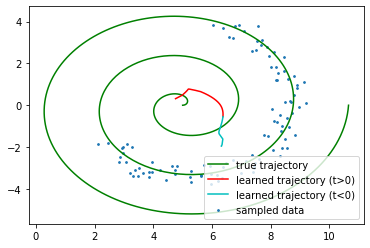

Iter: 350, running avg elbo: -5649.4577


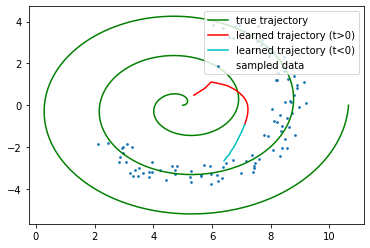

Iter: 360, running avg elbo: -5545.8855


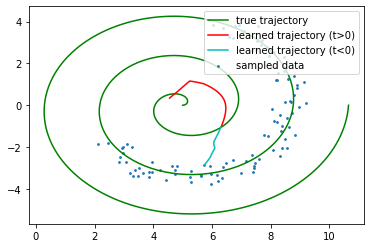

Iter: 370, running avg elbo: -5442.0233


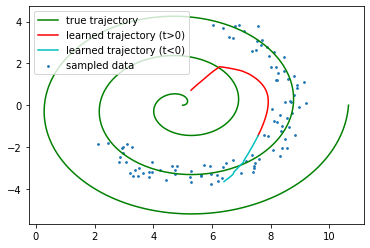

Iter: 380, running avg elbo: -5334.5432


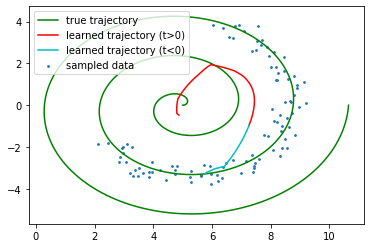

Iter: 390, running avg elbo: -5218.0909


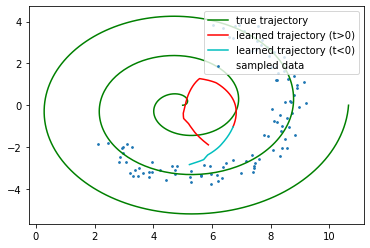

Iter: 400, running avg elbo: -5088.9952


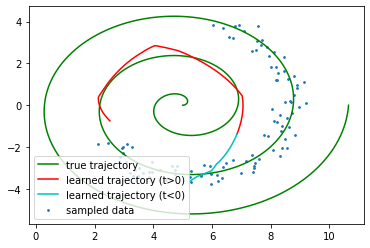

Iter: 410, running avg elbo: -4955.6445


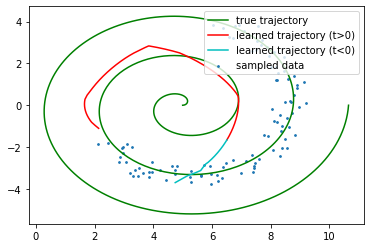

Iter: 420, running avg elbo: -4817.9748


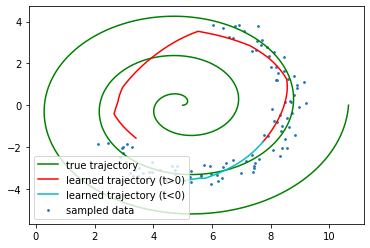

Iter: 430, running avg elbo: -4676.1392


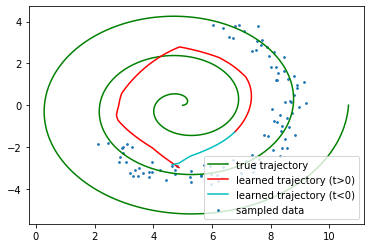

Iter: 440, running avg elbo: -4527.2520


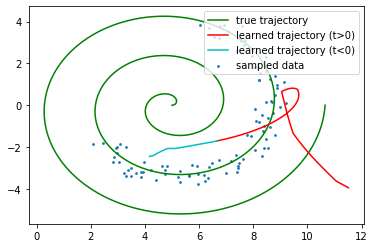

Iter: 450, running avg elbo: -4373.5555


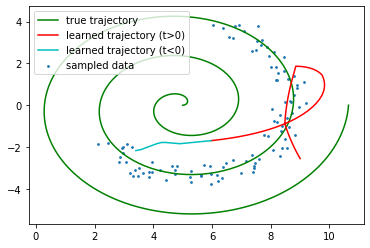

Iter: 460, running avg elbo: -4217.6369


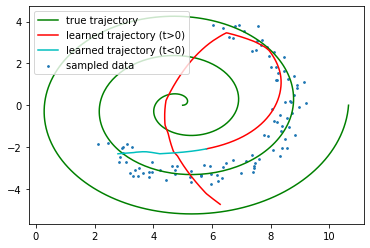

Iter: 470, running avg elbo: -4067.4807


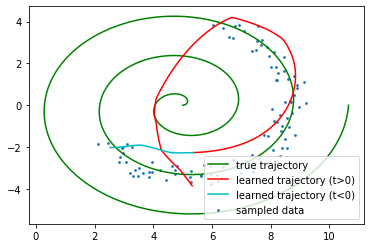

Iter: 480, running avg elbo: -3923.5979


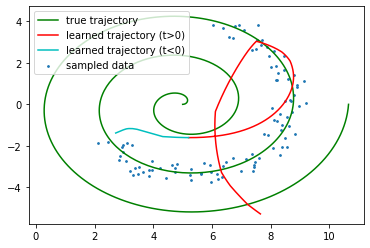

Iter: 490, running avg elbo: -3786.2872


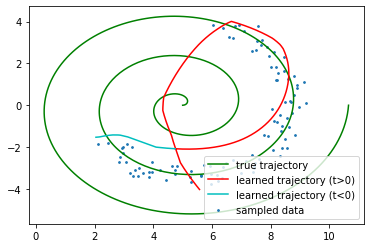

Iter: 500, running avg elbo: -3656.2260


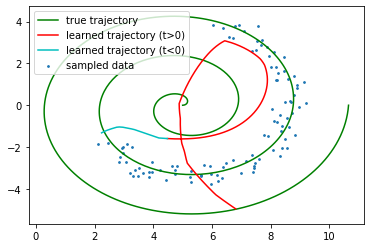

Iter: 510, running avg elbo: -3534.4231


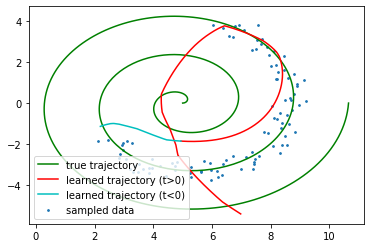

Iter: 520, running avg elbo: -3418.6593


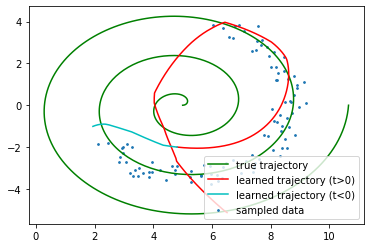

Iter: 530, running avg elbo: -3310.7617


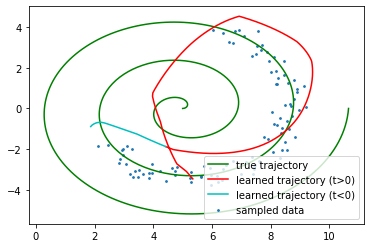

Iter: 540, running avg elbo: -3210.1547


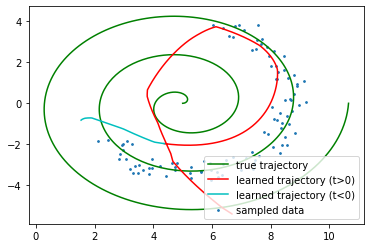

Iter: 550, running avg elbo: -3115.5133


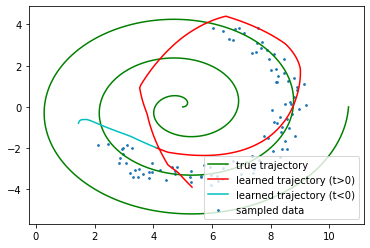

Iter: 560, running avg elbo: -3026.5496


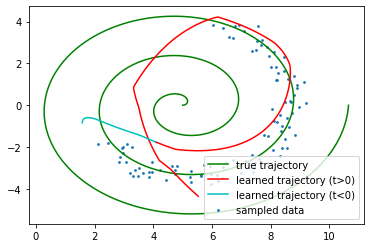

Iter: 570, running avg elbo: -2943.4212


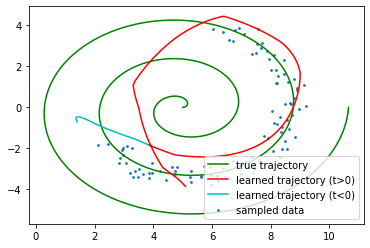

Iter: 580, running avg elbo: -2866.0887


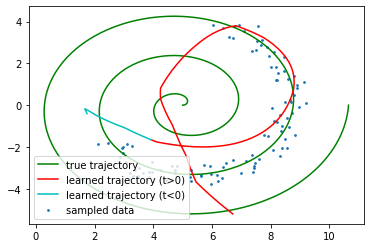

Iter: 590, running avg elbo: -2793.1865


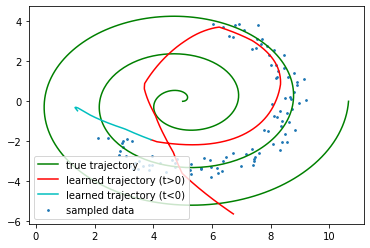

Iter: 600, running avg elbo: -2725.1661


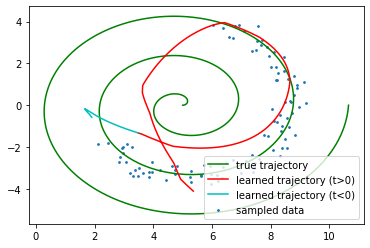

Iter: 610, running avg elbo: -2661.0652


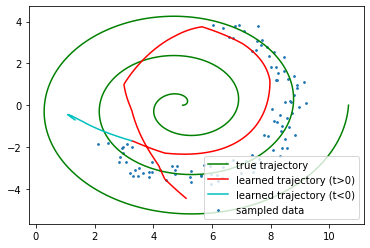

Iter: 620, running avg elbo: -2600.4632


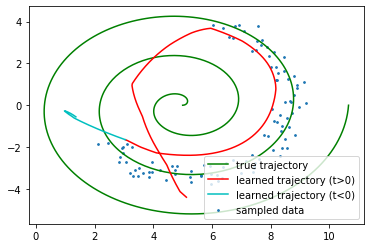

Iter: 630, running avg elbo: -2543.6706


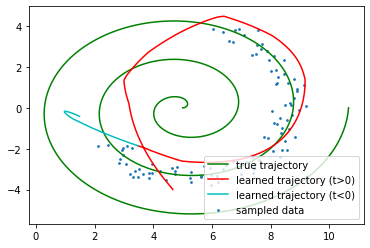

Iter: 640, running avg elbo: -2489.7376


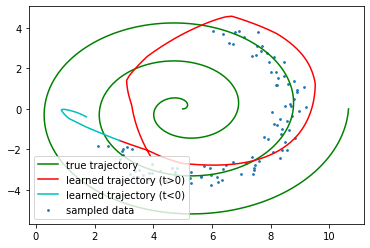

Iter: 650, running avg elbo: -2439.0029


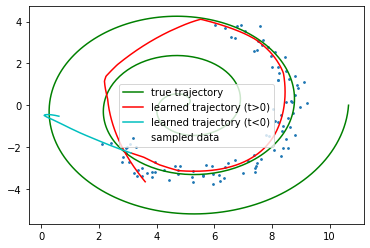

Iter: 660, running avg elbo: -2390.3190


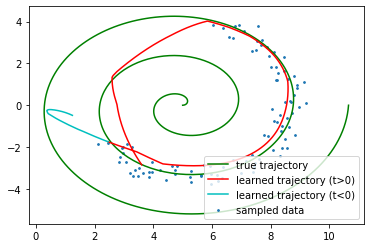

Iter: 670, running avg elbo: -2343.3889


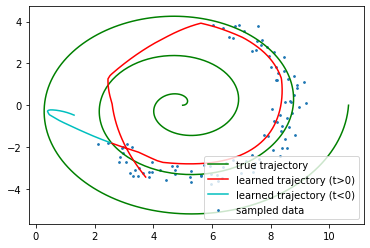

Iter: 680, running avg elbo: -2298.0993


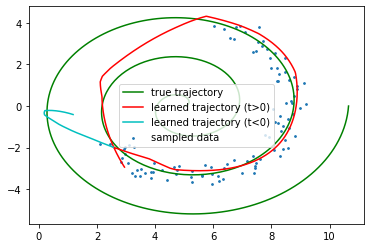

Iter: 690, running avg elbo: -2254.7664


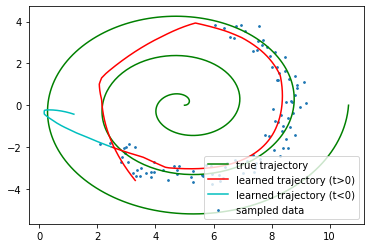

Iter: 700, running avg elbo: -2211.7947


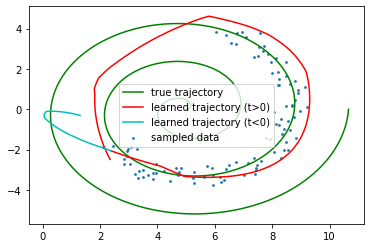

Iter: 710, running avg elbo: -2169.7734


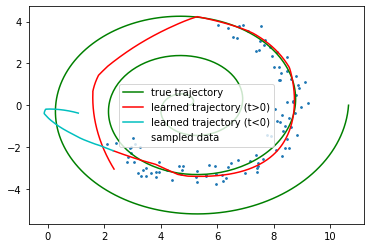

Iter: 720, running avg elbo: -2127.1574


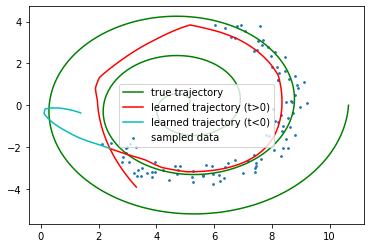

Iter: 730, running avg elbo: -2083.0459


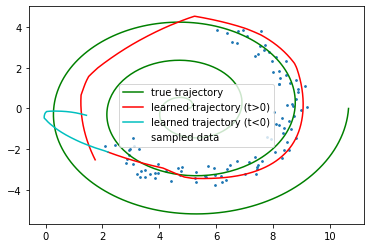

Iter: 740, running avg elbo: -2036.4771


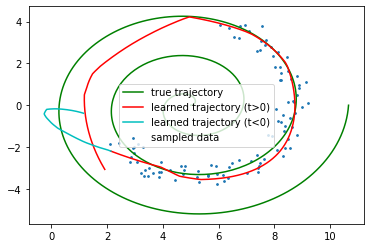

Iter: 750, running avg elbo: -1987.5095


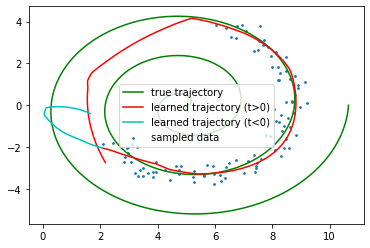

Iter: 760, running avg elbo: -1938.0757


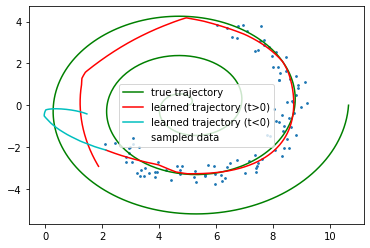

Iter: 770, running avg elbo: -1888.6234


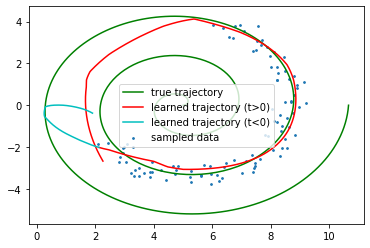

Iter: 780, running avg elbo: -1838.3672


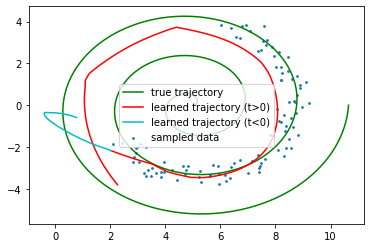

Iter: 790, running avg elbo: -1787.5754


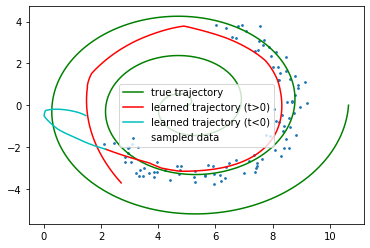

Iter: 800, running avg elbo: -1734.3738


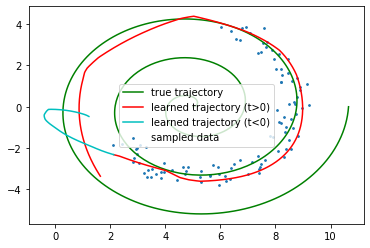

Iter: 810, running avg elbo: -1678.6391


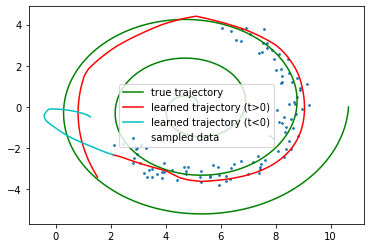

Iter: 820, running avg elbo: -1620.1022


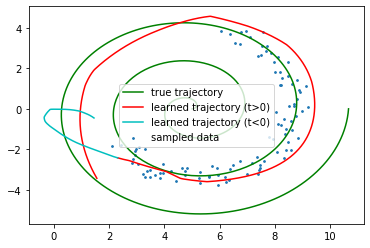

Iter: 830, running avg elbo: -1557.2902


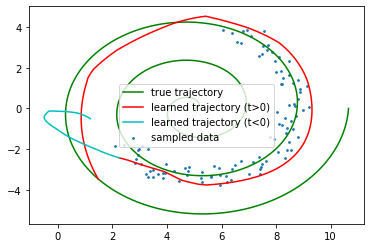

Iter: 840, running avg elbo: -1491.3530


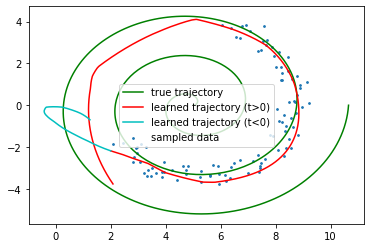

Iter: 850, running avg elbo: -1424.6109


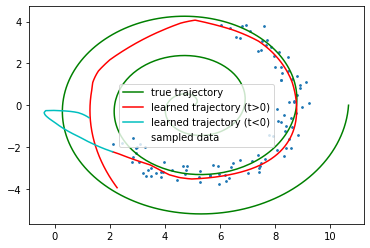

Iter: 860, running avg elbo: -1357.6697


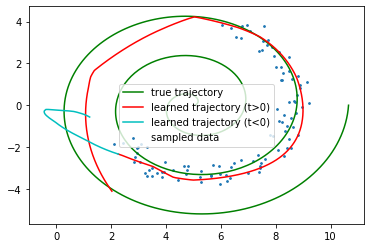

Iter: 870, running avg elbo: -1290.4234


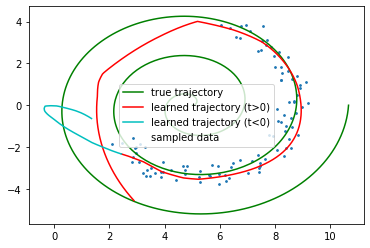

Iter: 880, running avg elbo: -1223.2450


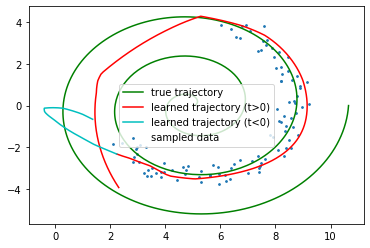

Iter: 890, running avg elbo: -1156.9386


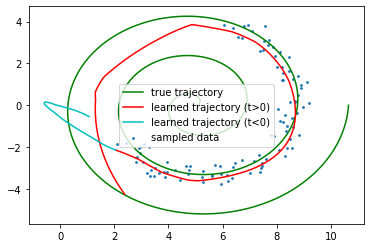

Iter: 900, running avg elbo: -1091.7435


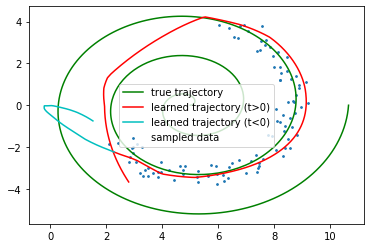

Iter: 910, running avg elbo: -1028.8165


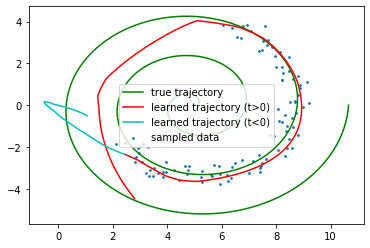

Iter: 920, running avg elbo: -968.5638


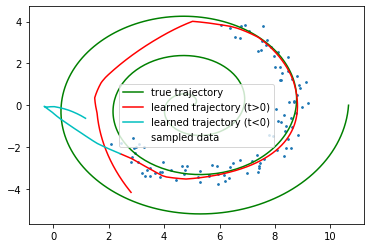

Iter: 930, running avg elbo: -911.6574


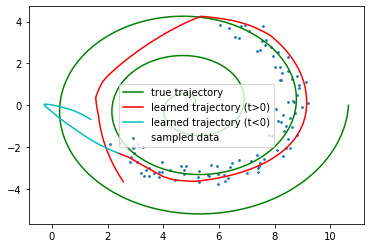

Iter: 940, running avg elbo: -858.0950


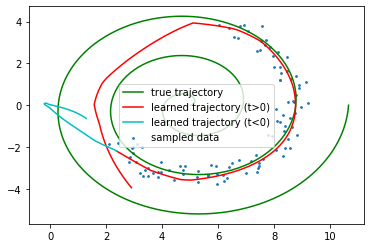

Iter: 950, running avg elbo: -808.1022


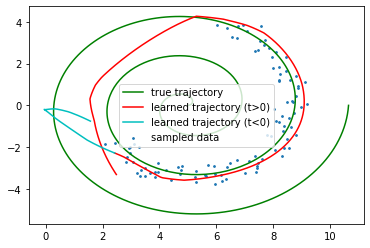

Iter: 960, running avg elbo: -761.3714


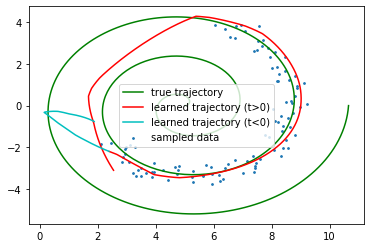

Iter: 970, running avg elbo: -717.7508


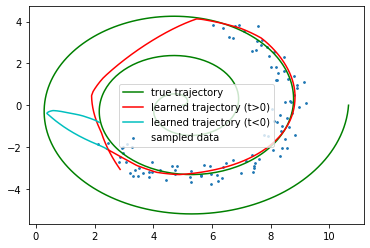

Iter: 980, running avg elbo: -677.3374


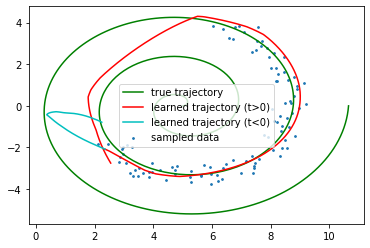

Iter: 990, running avg elbo: -639.5532


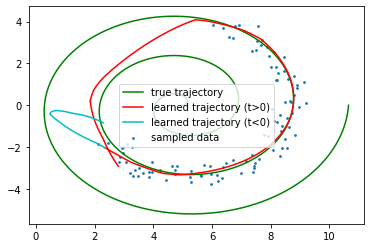

Iter: 1000, running avg elbo: -604.4425


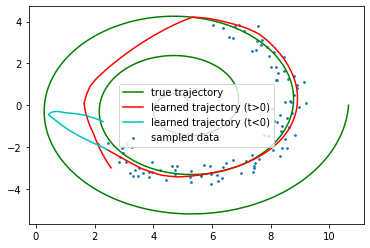

Iter: 1010, running avg elbo: -571.7317


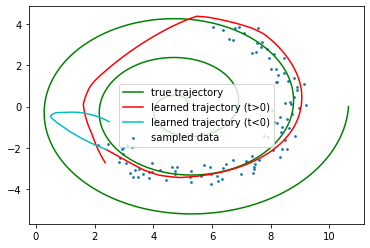

Iter: 1020, running avg elbo: -541.3367


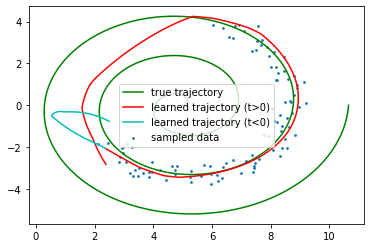

Iter: 1030, running avg elbo: -513.1009


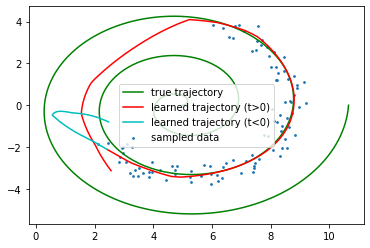

Iter: 1040, running avg elbo: -486.9606


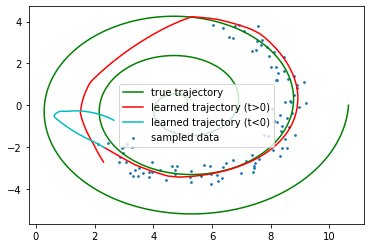

Iter: 1050, running avg elbo: -462.6215


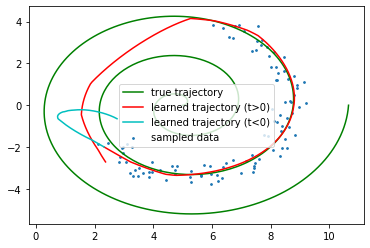

Iter: 1060, running avg elbo: -439.7971


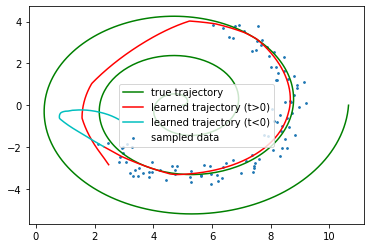

Iter: 1070, running avg elbo: -418.6943


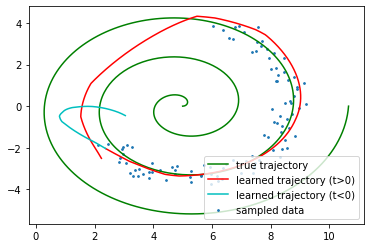

Iter: 1080, running avg elbo: -399.1541


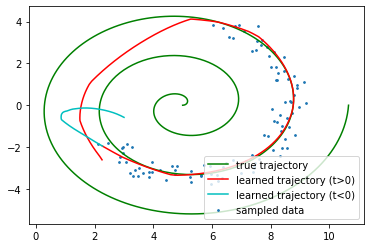

Iter: 1090, running avg elbo: -381.0035


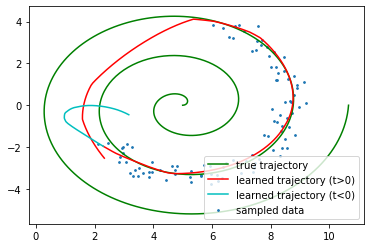

Iter: 1100, running avg elbo: -363.9636


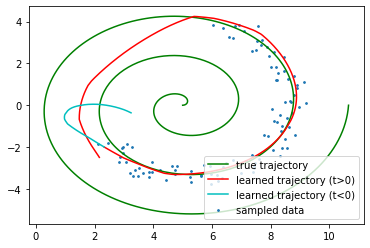

Iter: 1110, running avg elbo: -348.2156


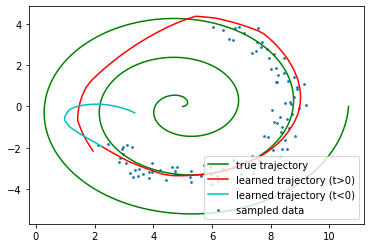

Iter: 1120, running avg elbo: -333.5140


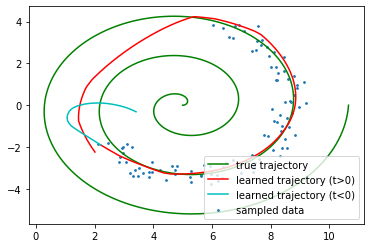

Iter: 1130, running avg elbo: -319.8651


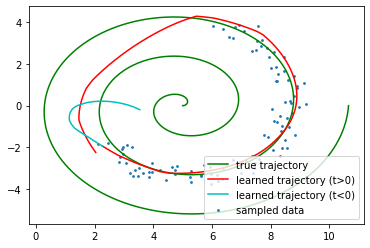

Iter: 1140, running avg elbo: -307.1857


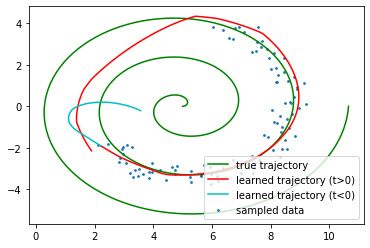

Iter: 1150, running avg elbo: -295.3810


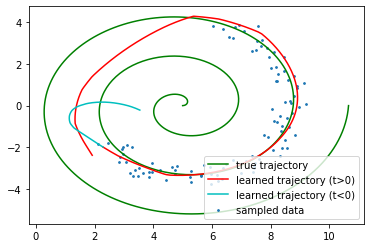

Iter: 1160, running avg elbo: -284.3650


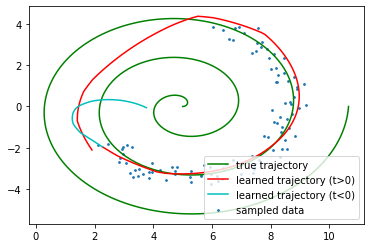

Iter: 1170, running avg elbo: -274.1668


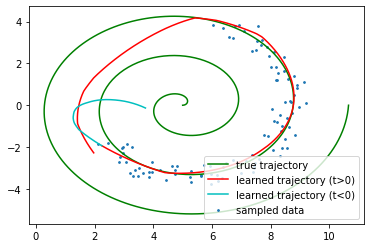

Iter: 1180, running avg elbo: -264.6119


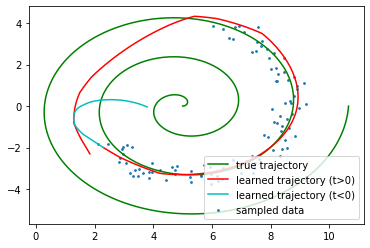

Iter: 1190, running avg elbo: -255.6652


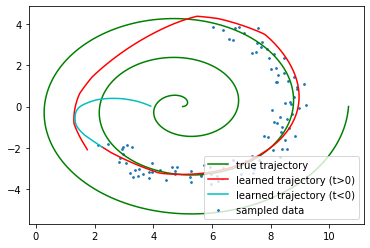

Iter: 1200, running avg elbo: -247.4626


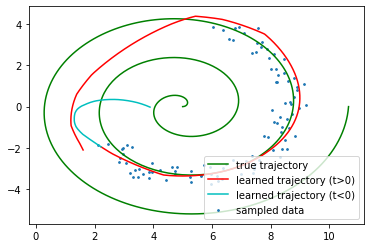

Iter: 1210, running avg elbo: -239.7154


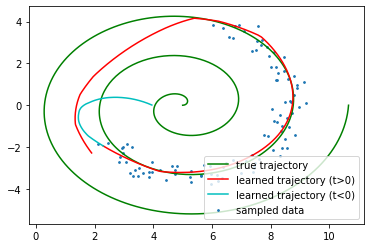

Iter: 1220, running avg elbo: -232.5250


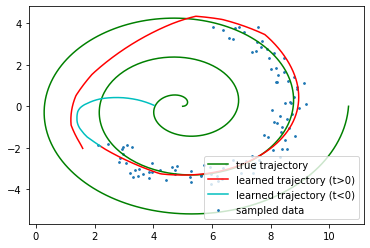

Iter: 1230, running avg elbo: -225.7281


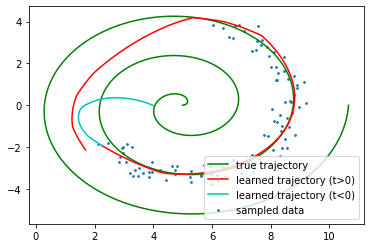

Iter: 1240, running avg elbo: -219.3712


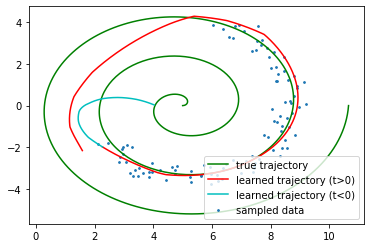

Iter: 1250, running avg elbo: -213.5683


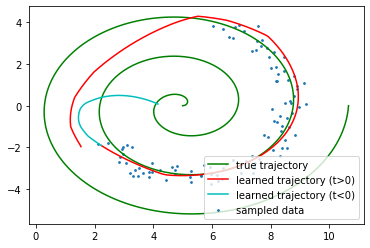

Iter: 1260, running avg elbo: -208.0230


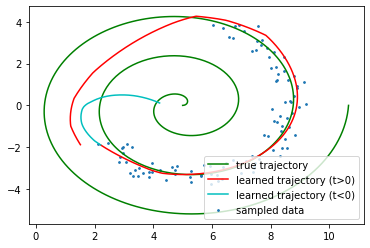

Iter: 1270, running avg elbo: -202.8680


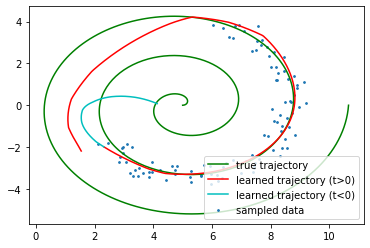

Iter: 1280, running avg elbo: -198.0041


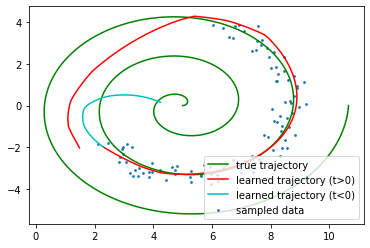

Iter: 1290, running avg elbo: -193.4455


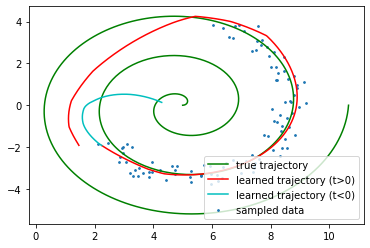

Iter: 1300, running avg elbo: -189.1601


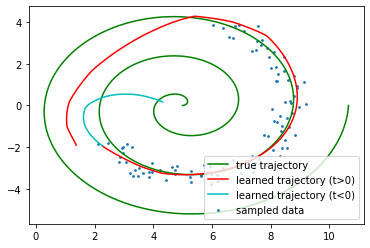

Iter: 1310, running avg elbo: -185.1223


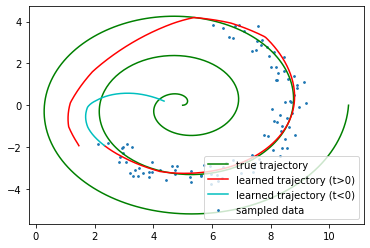

Iter: 1320, running avg elbo: -181.4165


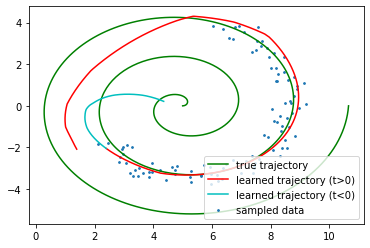

Iter: 1330, running avg elbo: -177.8679


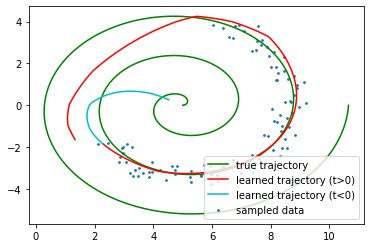

Iter: 1340, running avg elbo: -174.5213


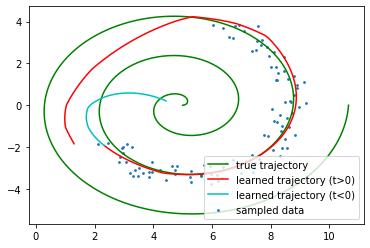

Iter: 1350, running avg elbo: -171.2735


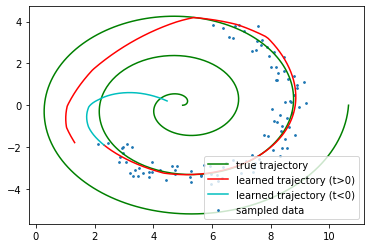

Iter: 1360, running avg elbo: -169.1631


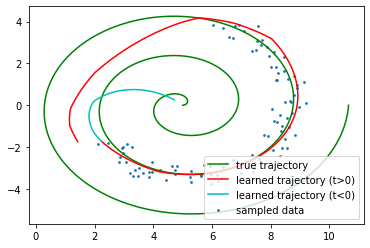

Iter: 1370, running avg elbo: -167.2456


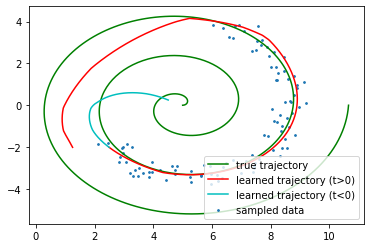

Iter: 1380, running avg elbo: -164.6541


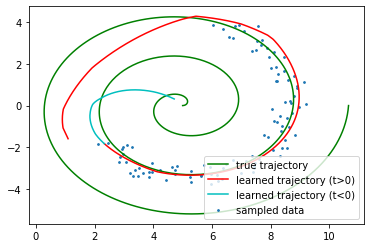

Iter: 1390, running avg elbo: -162.0372


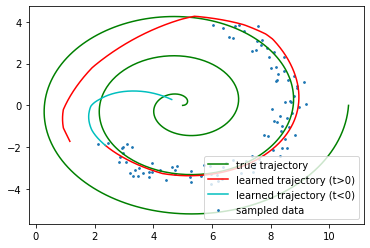

Iter: 1400, running avg elbo: -159.5107


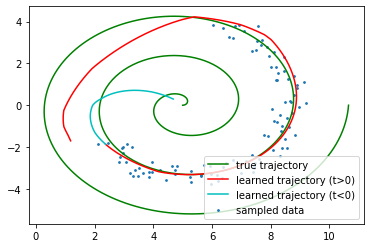

Iter: 1410, running avg elbo: -157.0492


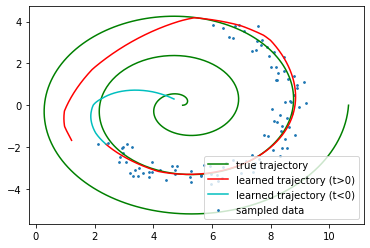

Iter: 1420, running avg elbo: -154.7867


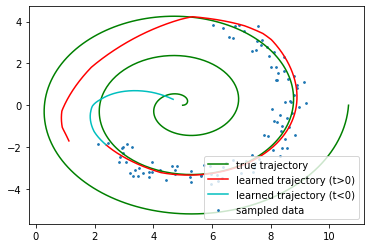

Iter: 1430, running avg elbo: -152.5796


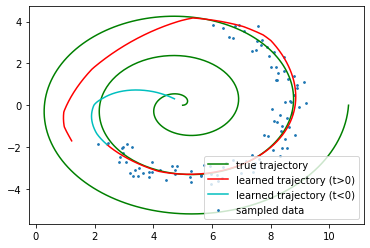

Iter: 1440, running avg elbo: -150.5650


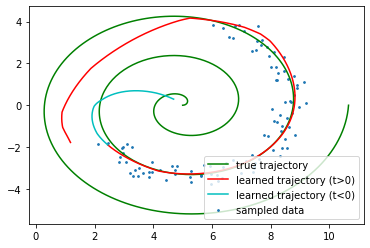

Iter: 1450, running avg elbo: -149.0227


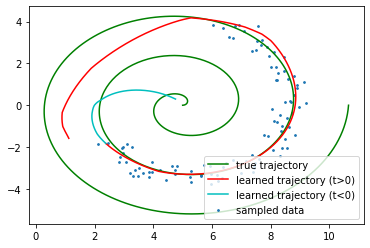

Iter: 1460, running avg elbo: -147.2350


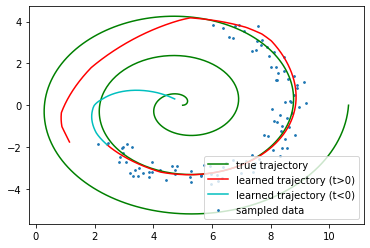

Iter: 1470, running avg elbo: -145.4465


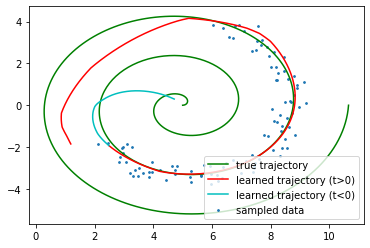

Iter: 1480, running avg elbo: -143.8023


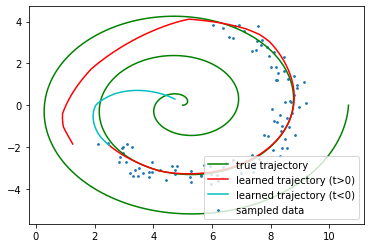

Iter: 1490, running avg elbo: -142.1987


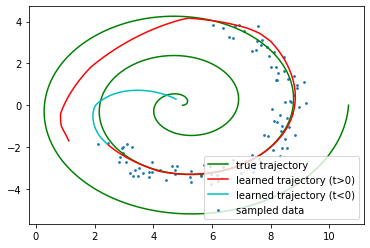

Iter: 1500, running avg elbo: -140.6459


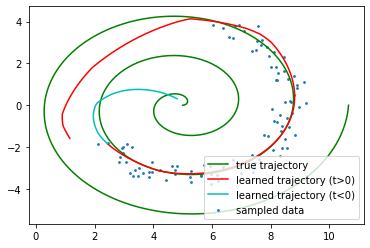

Iter: 1510, running avg elbo: -139.1543


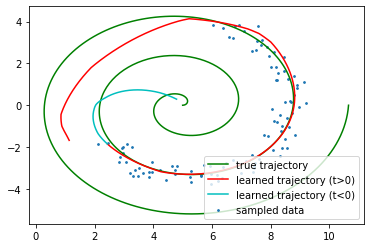

Iter: 1520, running avg elbo: -137.7413


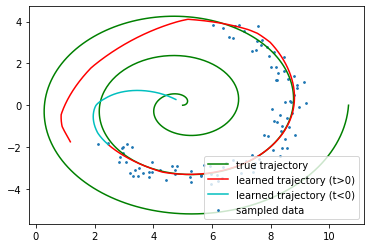

Iter: 1530, running avg elbo: -136.3768


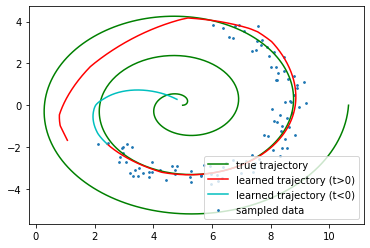

Iter: 1540, running avg elbo: -135.0765


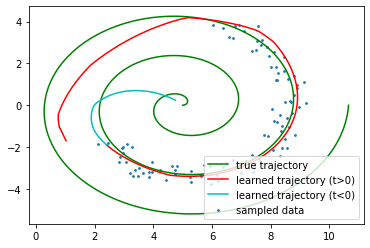

Iter: 1550, running avg elbo: -133.8172


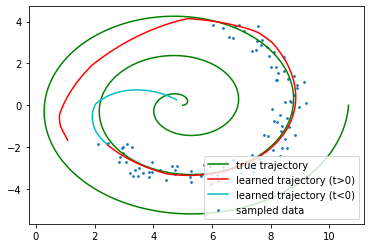

Iter: 1560, running avg elbo: -132.6656


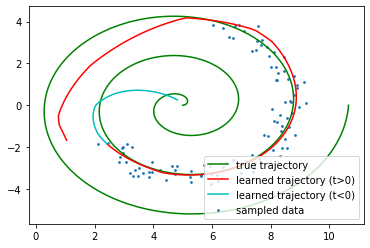

Iter: 1570, running avg elbo: -131.5793


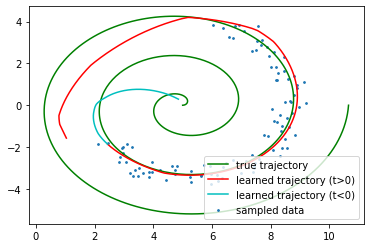

Iter: 1580, running avg elbo: -130.5254


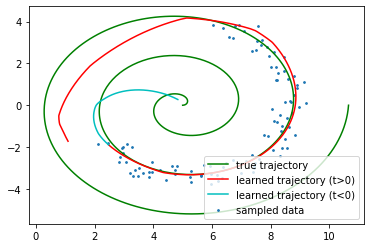

Iter: 1590, running avg elbo: -129.4470


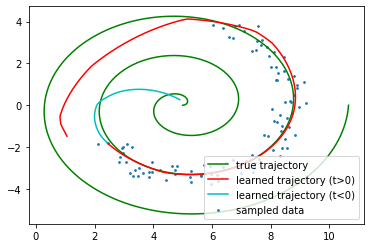

Iter: 1600, running avg elbo: -128.4336


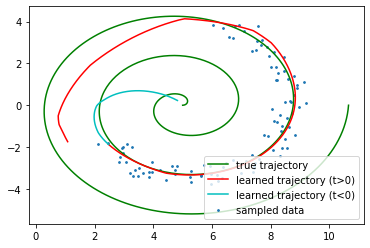

Iter: 1610, running avg elbo: -127.4473


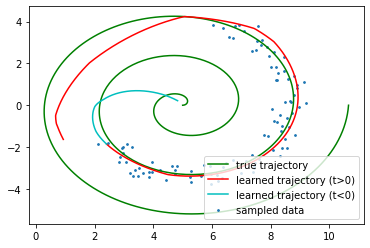

Iter: 1620, running avg elbo: -126.5448


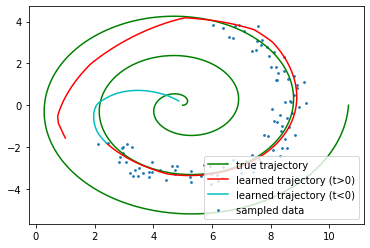

Iter: 1630, running avg elbo: -125.9638


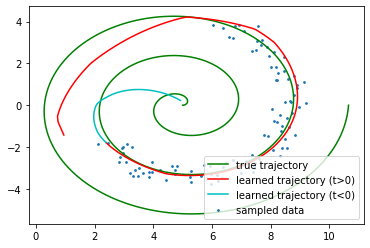

Iter: 1640, running avg elbo: -125.1578


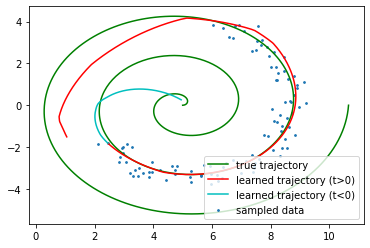

Iter: 1650, running avg elbo: -124.3229


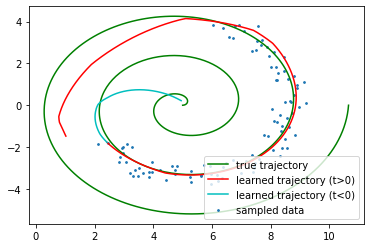

Iter: 1660, running avg elbo: -123.4919


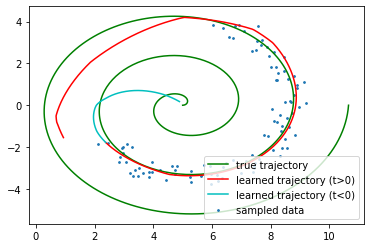

Iter: 1670, running avg elbo: -122.6900


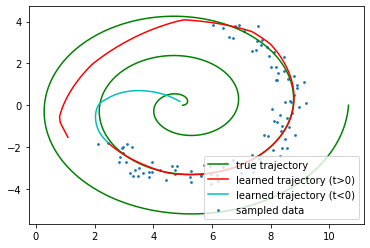

Iter: 1680, running avg elbo: -121.9155


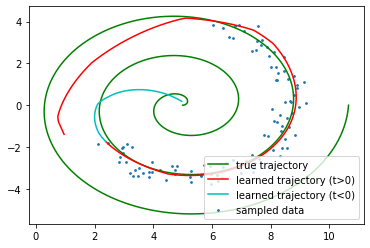

Iter: 1690, running avg elbo: -121.2211


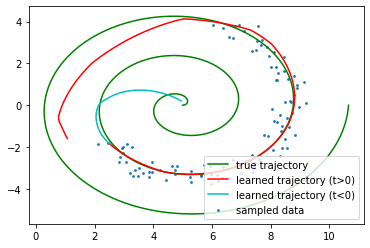

Iter: 1700, running avg elbo: -120.5459


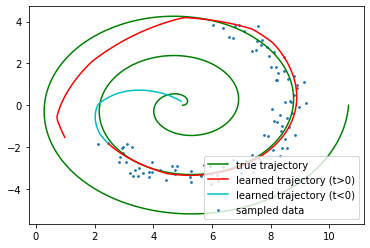

Iter: 1710, running avg elbo: -120.2460


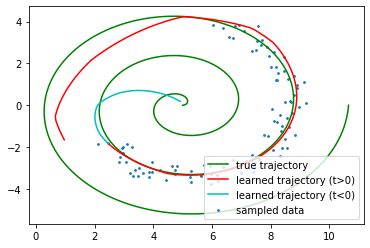

Iter: 1720, running avg elbo: -119.7779


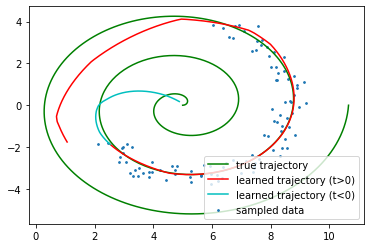

Iter: 1730, running avg elbo: -119.1426


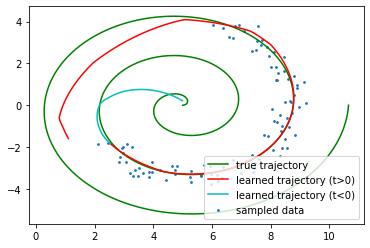

Iter: 1740, running avg elbo: -118.4893


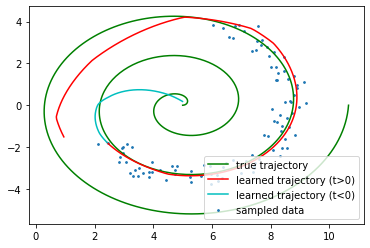

Iter: 1750, running avg elbo: -117.9322


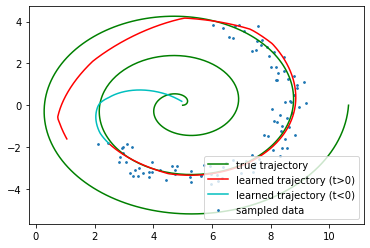

Iter: 1760, running avg elbo: -117.5854


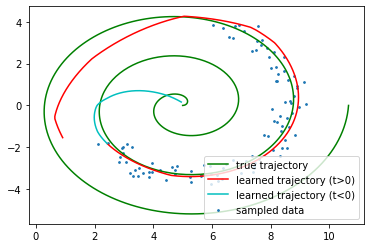

Iter: 1770, running avg elbo: -117.0284


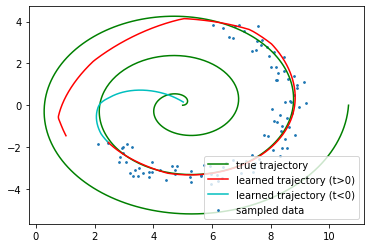

Iter: 1780, running avg elbo: -116.4120


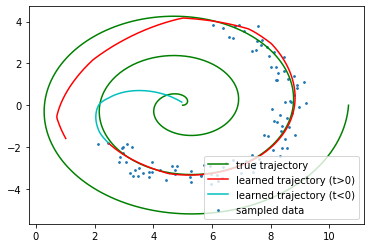

Iter: 1790, running avg elbo: -115.7905


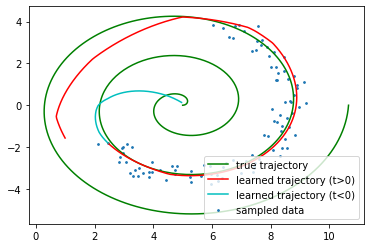

Iter: 1800, running avg elbo: -115.1580


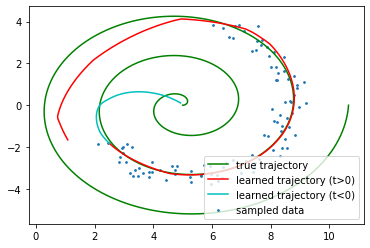

Iter: 1810, running avg elbo: -114.5605


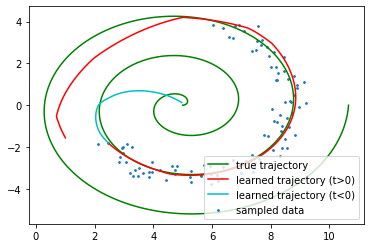

Iter: 1820, running avg elbo: -114.0252


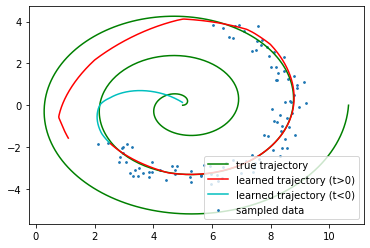

Iter: 1830, running avg elbo: -113.5639


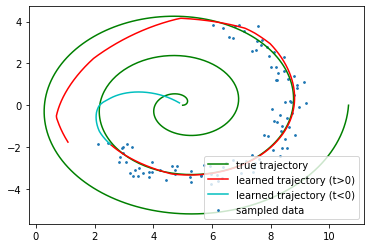

Iter: 1840, running avg elbo: -113.0842


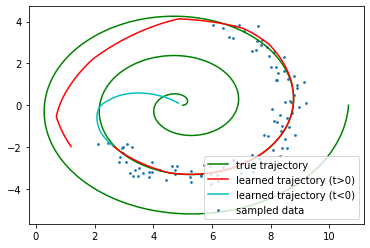

Iter: 1850, running avg elbo: -172.8766


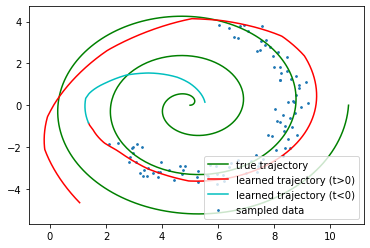

Iter: 1860, running avg elbo: -200.2897


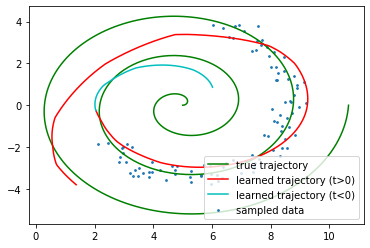

Iter: 1870, running avg elbo: -209.3078


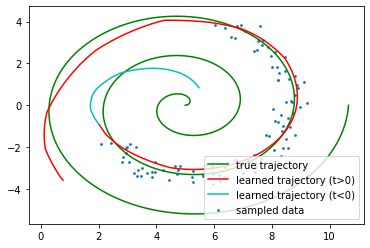

Iter: 1880, running avg elbo: -209.0082


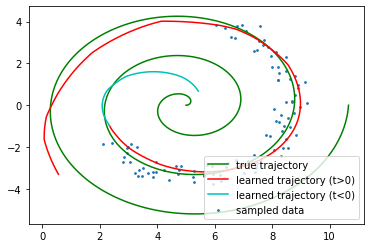

Iter: 1890, running avg elbo: -205.5346


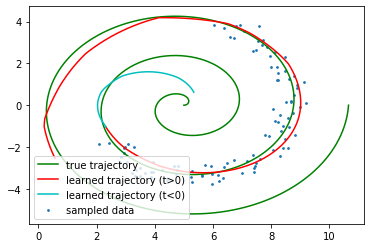

Iter: 1900, running avg elbo: -200.6393


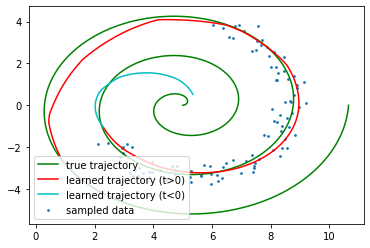

Iter: 1910, running avg elbo: -195.3929


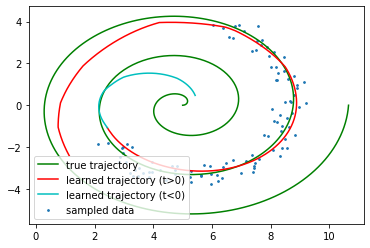

Iter: 1920, running avg elbo: -190.0906


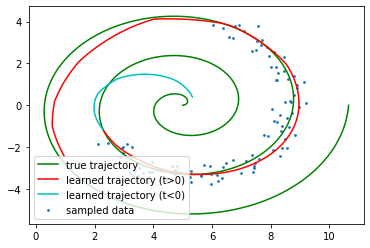

Iter: 1930, running avg elbo: -184.9340


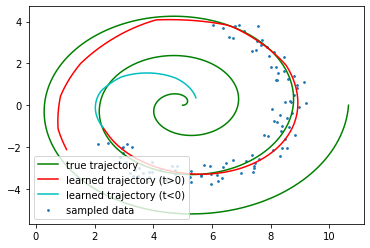

Iter: 1940, running avg elbo: -179.9308


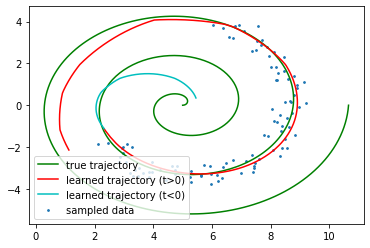

Iter: 1950, running avg elbo: -175.1511


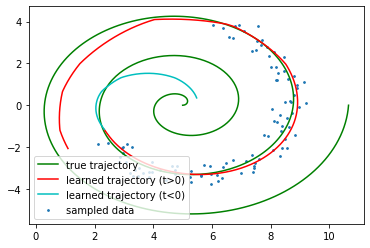

Iter: 1960, running avg elbo: -170.6673


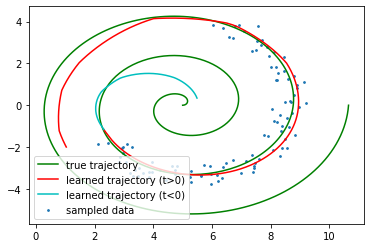

Iter: 1970, running avg elbo: -166.3826


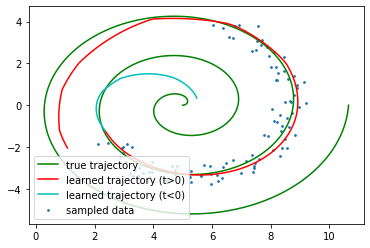

Iter: 1980, running avg elbo: -162.3636


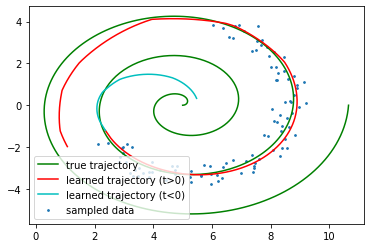

Iter: 1990, running avg elbo: -158.5972


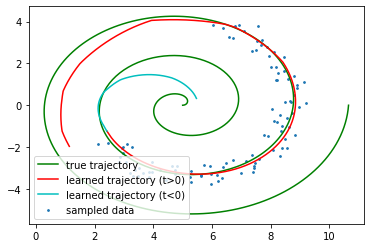

Iter: 2000, running avg elbo: -155.0630


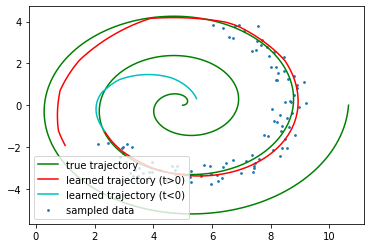

Training complete after 2000 iters.


In [7]:
# Import non-adjoint backpropagation
from torchdiffeq import odeint

visualize = True
train_dir = './'
n_iters = 2000
opt_lr = 0.001

latent_dim = 4
nhidden = 20
rnn_nhidden = 25
obs_dim = 2
nspiral = 1000
start = 0.
stop = 6 * np.pi
noise_std = .3
a = 0.
b = .3
ntotal = 1000
nsample = 100
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# generate toy spiral data
orig_trajs, samp_trajs, orig_ts, samp_ts = generate_spiral2d(
    nspiral=nspiral,
    start=start,
    stop=stop,
    noise_std=noise_std,
    a=a, b=b
)
orig_trajs = torch.from_numpy(orig_trajs).float().to(device)
samp_trajs = torch.from_numpy(samp_trajs).float().to(device)
samp_ts = torch.from_numpy(samp_ts).float().to(device)

# model
func = LatentODEfunc(latent_dim, nhidden).to(device)
rec = RecognitionRNN(latent_dim, obs_dim, rnn_nhidden, nspiral).to(device)
dec = Decoder(latent_dim, obs_dim, nhidden).to(device)
params = (list(func.parameters()) + list(dec.parameters()) + list(rec.parameters()))
optimizer = optim.Adam(params, lr=opt_lr)
loss_meter = RunningAverageMeter()

if train_dir is not None:
    if not os.path.exists(train_dir):
        os.makedirs(train_dir)
    ckpt_path = os.path.join(train_dir, 'ckpt_2ds_node.pth')
    if os.path.exists(ckpt_path):
        checkpoint = torch.load(ckpt_path)
        func.load_state_dict(checkpoint['func_state_dict'])
        rec.load_state_dict(checkpoint['rec_state_dict'])
        dec.load_state_dict(checkpoint['dec_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        orig_trajs = checkpoint['orig_trajs']
        samp_trajs = checkpoint['samp_trajs']
        orig_ts = checkpoint['orig_ts']
        samp_ts = checkpoint['samp_ts']
        print('Loaded ckpt from {}'.format(ckpt_path))

try:
    for itr in range(1, n_iters + 1):
        optimizer.zero_grad()
        # backward in time to infer q(z_0)
        h = rec.initHidden().to(device)
        for t in reversed(range(samp_trajs.size(1))):
            obs = samp_trajs[:, t, :]
            out, h = rec.forward(obs, h)
        qz0_mean, qz0_logvar = out[:, :latent_dim], out[:, latent_dim:]
        epsilon = torch.randn(qz0_mean.size()).to(device)
        z0 = epsilon * torch.exp(.5 * qz0_logvar) + qz0_mean

        # forward in time and solve ode for reconstructions
        pred_z = odeint(func, z0, samp_ts).permute(1, 0, 2)
        pred_x = dec(pred_z)

        # compute loss
        noise_std_ = torch.zeros(pred_x.size()).to(device) + noise_std
        noise_logvar = 2. * torch.log(noise_std_).to(device)
        logpx = log_normal_pdf(
            samp_trajs, pred_x, noise_logvar).sum(-1).sum(-1)
        pz0_mean = pz0_logvar = torch.zeros(z0.size()).to(device)
        analytic_kl = normal_kl(qz0_mean, qz0_logvar,
                                pz0_mean, pz0_logvar).sum(-1)
        loss = torch.mean(-logpx + analytic_kl, dim=0)
        loss.backward()
        optimizer.step()
        loss_meter.update(loss.item())

        if itr % 10 == 0:
            print('Iter: {}, running avg elbo: {:.4f}'.format(itr, -loss_meter.avg))

            if visualize:
                with torch.no_grad():
                    # sample from trajectorys' approx. posterior
                    h = rec.initHidden().to(device)
                    for t in reversed(range(samp_trajs.size(1))):
                        obs = samp_trajs[:, t, :]
                        out, h = rec.forward(obs, h)
                    qz0_mean, qz0_logvar = out[:, :latent_dim], out[:, latent_dim:]
                    epsilon = torch.randn(qz0_mean.size()).to(device)
                    z0 = epsilon * torch.exp(.5 * qz0_logvar) + qz0_mean
                    if isinstance(orig_ts, np.ndarray):
                        orig_ts = torch.from_numpy(orig_ts).float().to(device)

                    # take first trajectory for visualization
                    z0 = z0[0]

                    ts_pos = np.linspace(0., 2. * np.pi, num=2000)
                    ts_neg = np.linspace(-np.pi, 0., num=2000)[::-1].copy()
                    ts_pos = torch.from_numpy(ts_pos).float().to(device)
                    ts_neg = torch.from_numpy(ts_neg).float().to(device)

                    zs_pos = odeint(func, z0, ts_pos)
                    zs_neg = odeint(func, z0, ts_neg)

                    xs_pos = dec(zs_pos)
                    xs_neg = torch.flip(dec(zs_neg), dims=[0])

                xs_pos = xs_pos.cpu().numpy()
                xs_neg = xs_neg.cpu().numpy()
                orig_traj = orig_trajs[0].cpu().numpy()
                samp_traj = samp_trajs[0].cpu().numpy()

                plt.figure()
                plt.plot(orig_traj[:, 0], orig_traj[:, 1],
                         'g', label='true trajectory')
                plt.plot(xs_pos[:, 0], xs_pos[:, 1], 'r',
                         label='learned trajectory (t>0)')
                plt.plot(xs_neg[:, 0], xs_neg[:, 1], 'c',
                         label='learned trajectory (t<0)')
                plt.scatter(samp_traj[:, 0], samp_traj[
                            :, 1], label='sampled data', s=3)
                plt.legend()
                plt.show()

except KeyboardInterrupt:
    if train_dir is not None:
        ckpt_path = os.path.join(train_dir, 'ckpt_2ds_node.pth')
        torch.save({
            'func_state_dict': func.state_dict(),
            'rec_state_dict': rec.state_dict(),
            'dec_state_dict': dec.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'orig_trajs': orig_trajs,
            'samp_trajs': samp_trajs,
            'orig_ts': orig_ts,
            'samp_ts': samp_ts,
        }, ckpt_path)
        print('Stored ckpt at {}'.format(ckpt_path))
print('Training complete after {} iters.'.format(itr))

plt.close('all')

### Experimenting with adjoint backpropagation

The adjoint method can be slower when using an adaptive ODE solver as it involves another solve in the backward pass with a much larger system.

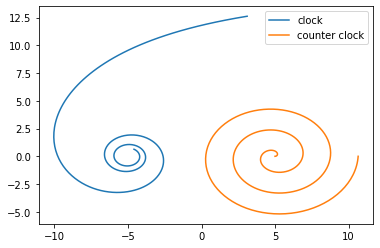

Iter: 10, running avg elbo: -18901.8824


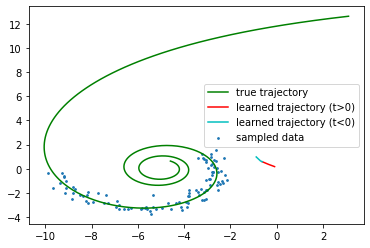

Iter: 20, running avg elbo: -18800.5236


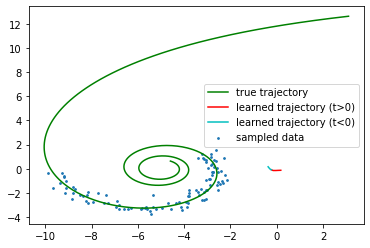

Iter: 30, running avg elbo: -18578.8320


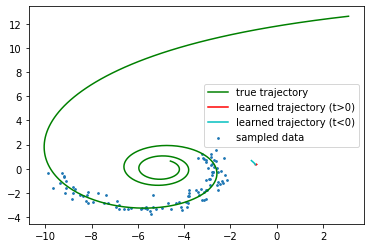

Iter: 40, running avg elbo: -18170.3205


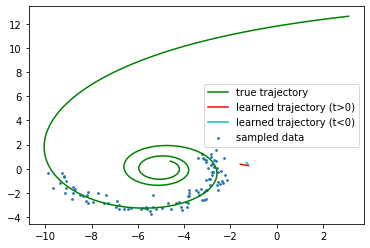

Iter: 50, running avg elbo: -17531.4230


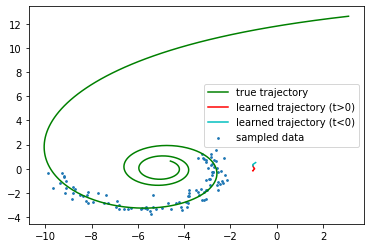

Iter: 60, running avg elbo: -16698.0694


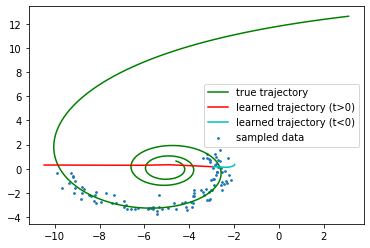

Iter: 70, running avg elbo: -15807.7104


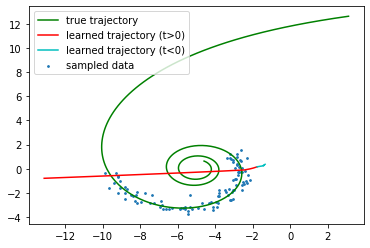

Iter: 80, running avg elbo: -14940.4721


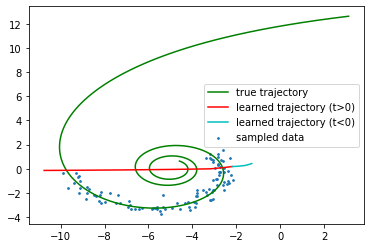

Iter: 90, running avg elbo: -14122.9324


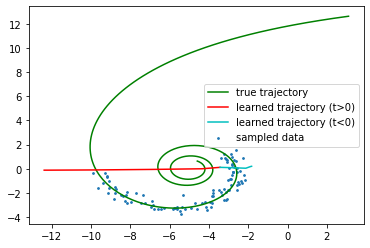

Iter: 100, running avg elbo: -13360.2030


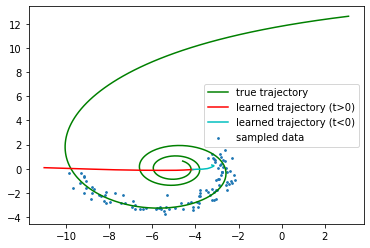

Iter: 110, running avg elbo: -12653.4605


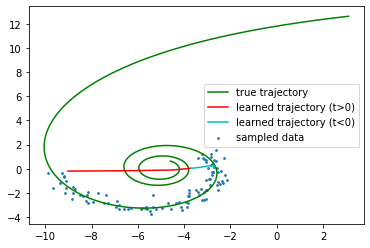

Iter: 120, running avg elbo: -11998.9083


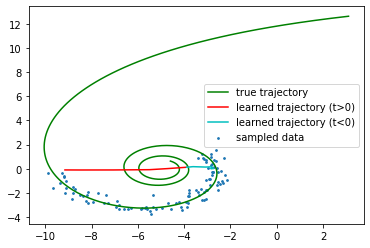

Iter: 130, running avg elbo: -11399.1466


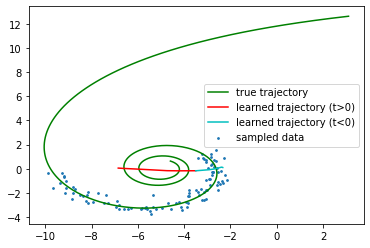

Iter: 140, running avg elbo: -10846.9124


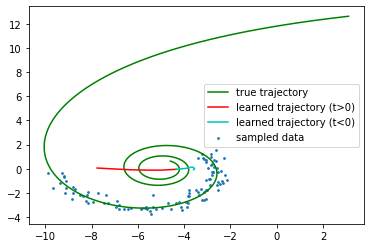

Iter: 150, running avg elbo: -10342.8145


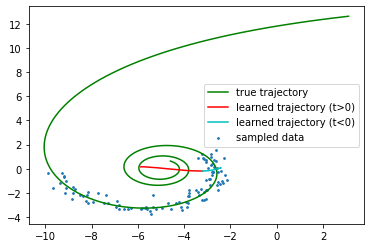

Iter: 160, running avg elbo: -9883.3681


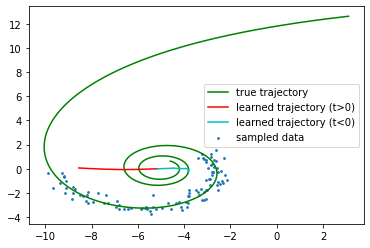

Iter: 170, running avg elbo: -9463.6207


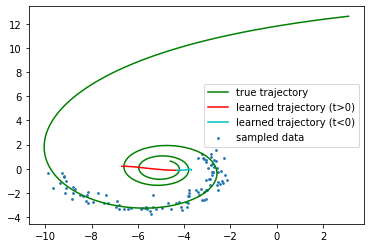

Iter: 180, running avg elbo: -9080.4302


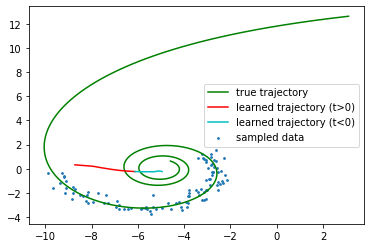

Iter: 190, running avg elbo: -8731.4717


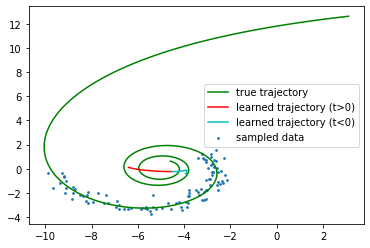

Iter: 200, running avg elbo: -8412.1204


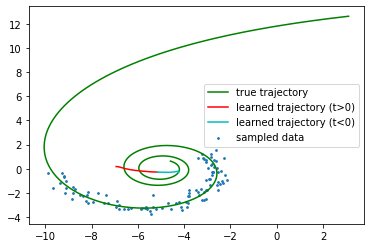

Iter: 210, running avg elbo: -8119.7781


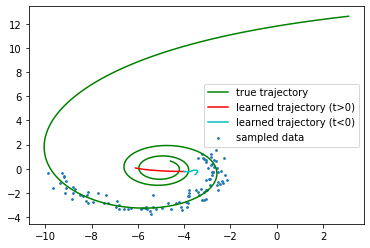

Iter: 220, running avg elbo: -7849.4541


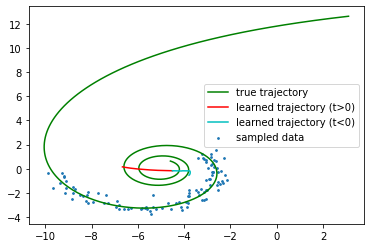

Iter: 230, running avg elbo: -7598.5516


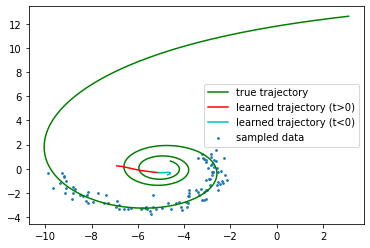

Iter: 240, running avg elbo: -7367.0000


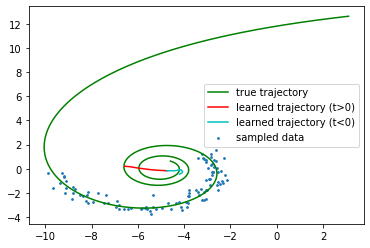

Iter: 250, running avg elbo: -7152.2510


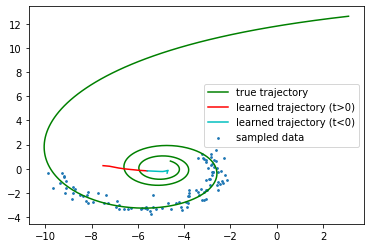

Iter: 260, running avg elbo: -6954.8901


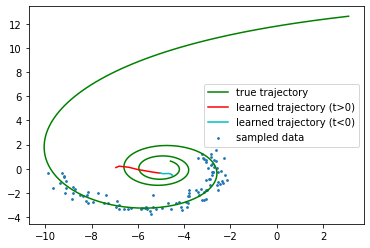

Iter: 270, running avg elbo: -6769.3358


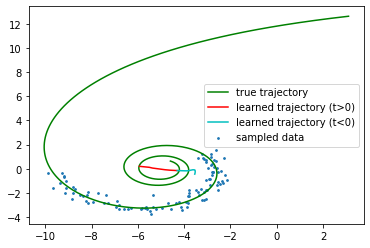

Iter: 280, running avg elbo: -6596.2978


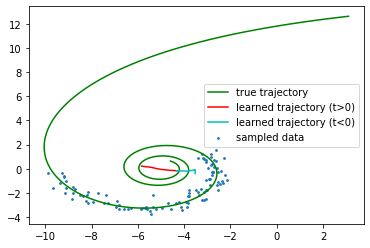

Iter: 290, running avg elbo: -6433.0837


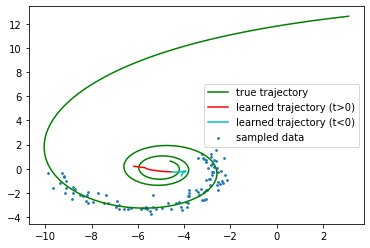

Iter: 300, running avg elbo: -6277.4219


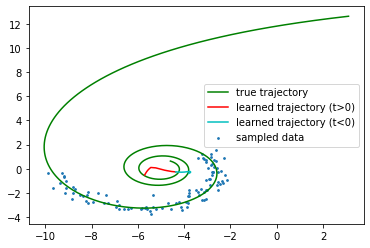

Iter: 310, running avg elbo: -6126.0326


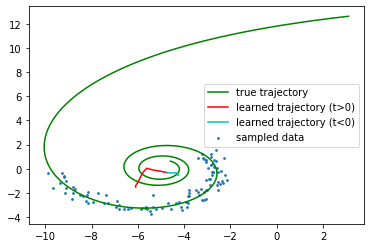

Iter: 320, running avg elbo: -5974.4613


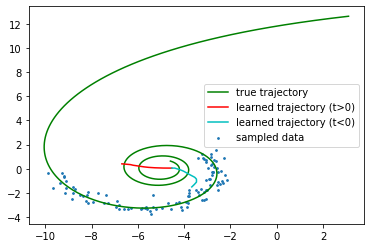

Iter: 330, running avg elbo: -5821.7179


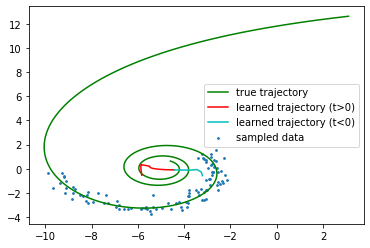

Iter: 340, running avg elbo: -5663.9801


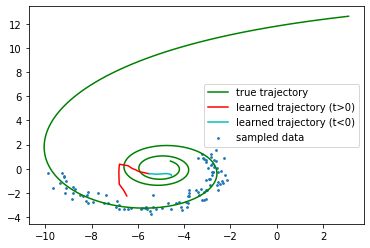

Iter: 350, running avg elbo: -5501.7978


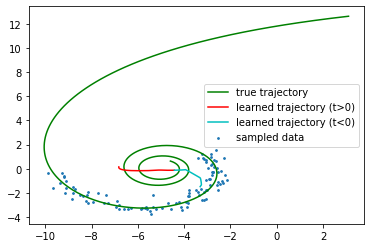

Iter: 360, running avg elbo: -5337.4938


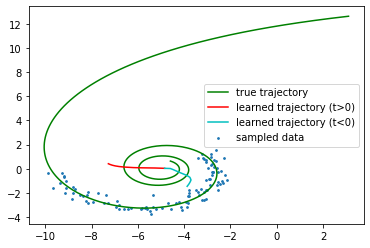

Iter: 370, running avg elbo: -5174.0676


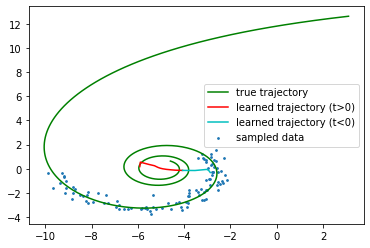

Iter: 380, running avg elbo: -5015.2185


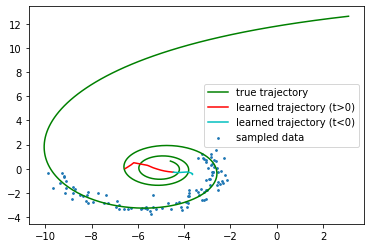

Iter: 390, running avg elbo: -4859.2037


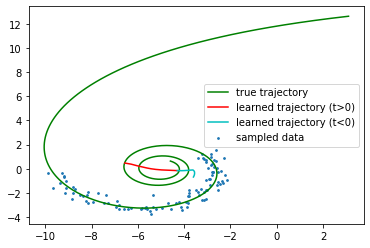

Iter: 400, running avg elbo: -4708.6061


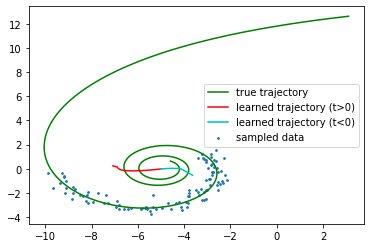

Iter: 410, running avg elbo: -4561.8035


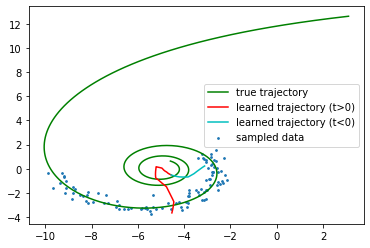

Iter: 420, running avg elbo: -4419.4918


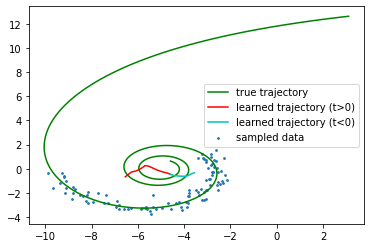

Iter: 430, running avg elbo: -4282.5956


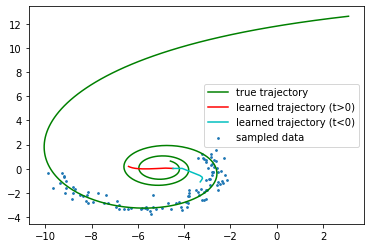

Iter: 440, running avg elbo: -4150.3962


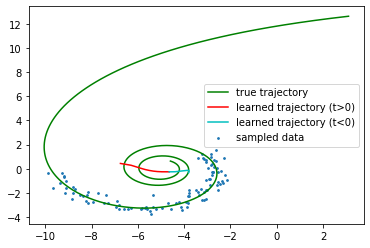

Iter: 450, running avg elbo: -4025.8516


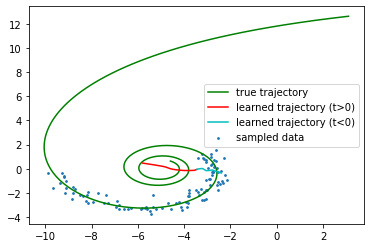

Iter: 460, running avg elbo: -3899.8654


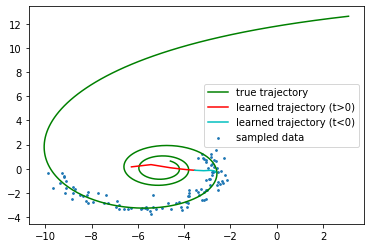

Iter: 470, running avg elbo: -3773.9994


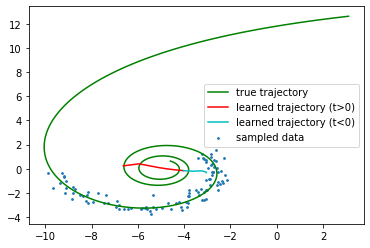

Iter: 480, running avg elbo: -3649.1716


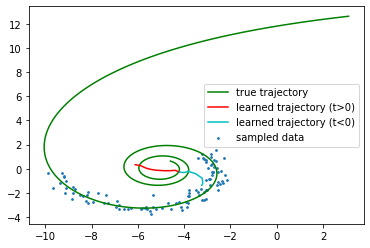

Iter: 490, running avg elbo: -3528.3495


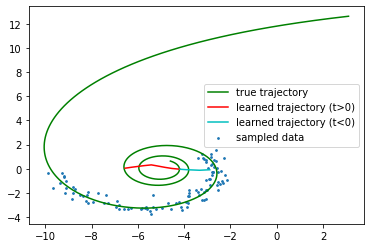

Iter: 500, running avg elbo: -3413.0236


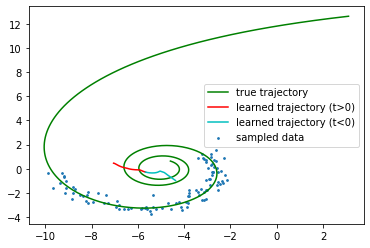

Iter: 510, running avg elbo: -3302.7518


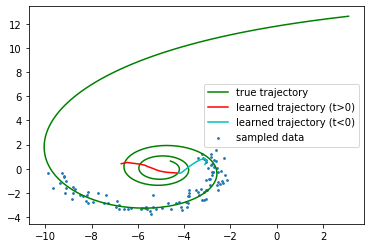

Iter: 520, running avg elbo: -3196.3186


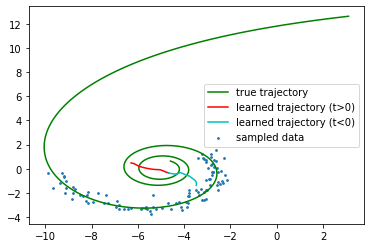

Iter: 530, running avg elbo: -3095.3989


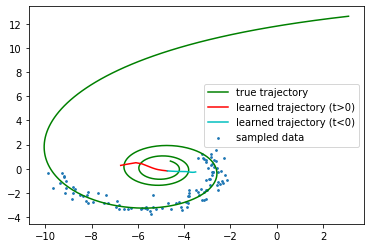

Iter: 540, running avg elbo: -3000.0461


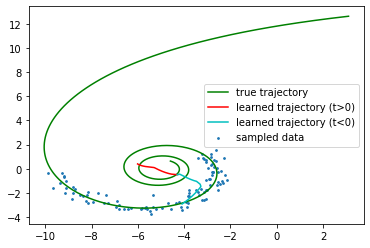

Iter: 550, running avg elbo: -2909.6330


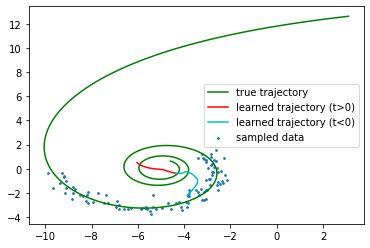

Iter: 560, running avg elbo: -2824.1326


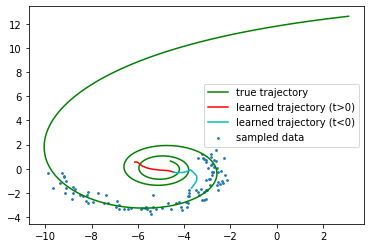

Iter: 570, running avg elbo: -2743.1280


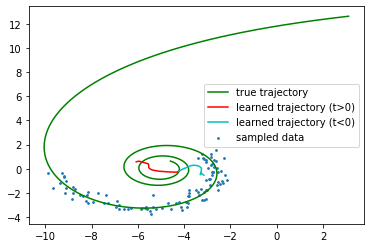

Iter: 580, running avg elbo: -2667.1329


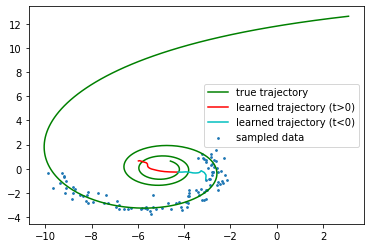

Iter: 590, running avg elbo: -2596.0630


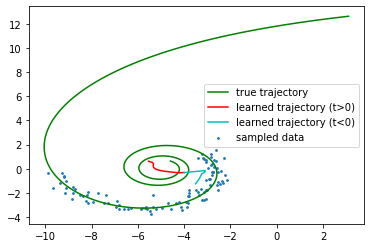

Iter: 600, running avg elbo: -2529.0009


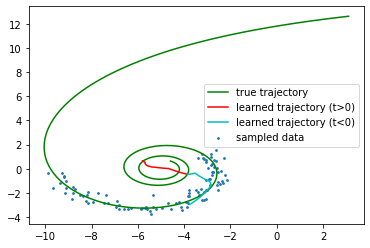

Iter: 610, running avg elbo: -2465.8212


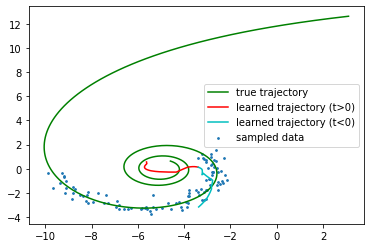

Iter: 620, running avg elbo: -2406.9747


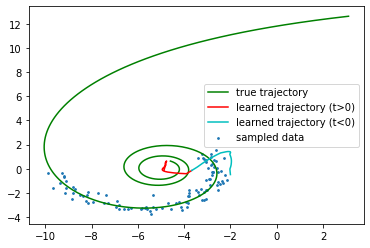

Iter: 630, running avg elbo: -2351.4745


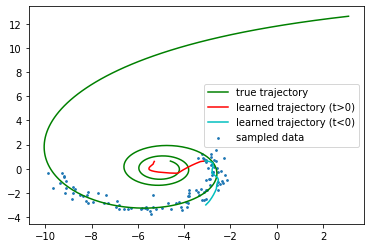

Iter: 640, running avg elbo: -2299.4149


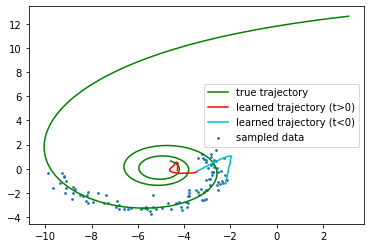

Iter: 650, running avg elbo: -2250.6255


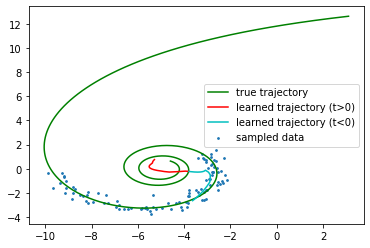

Iter: 660, running avg elbo: -2204.0755


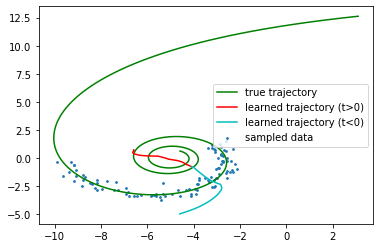

Iter: 670, running avg elbo: -2160.0870


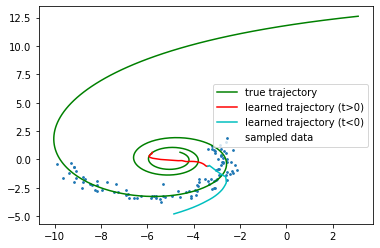

Iter: 680, running avg elbo: -2118.8689


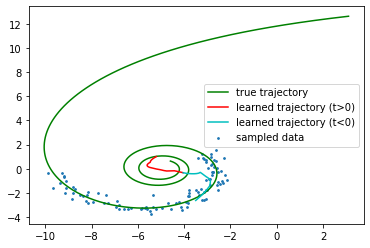

Iter: 690, running avg elbo: -2079.1187


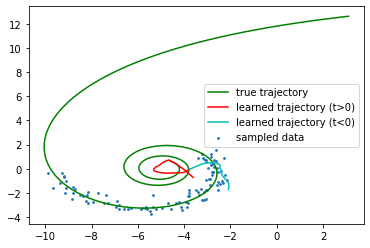

Iter: 700, running avg elbo: -2040.3131


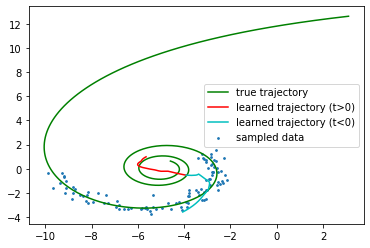

Iter: 710, running avg elbo: -2001.7565


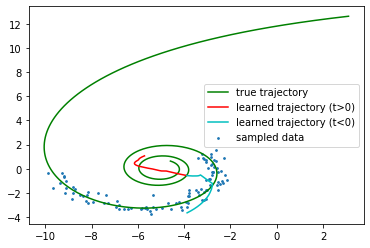

Iter: 720, running avg elbo: -1963.8861


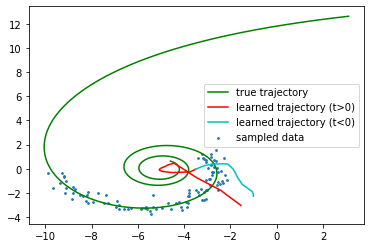

Iter: 730, running avg elbo: -1923.7293


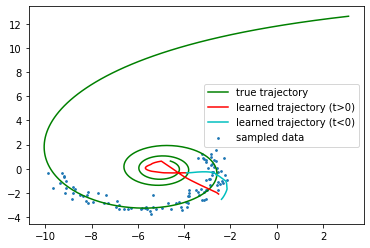

Iter: 740, running avg elbo: -1882.2901


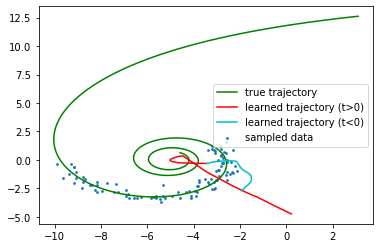

Iter: 750, running avg elbo: -1838.3104


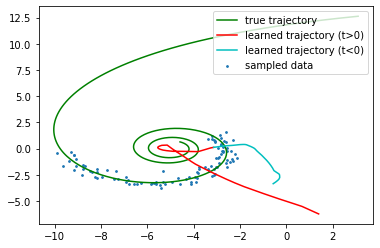

Iter: 760, running avg elbo: -1792.9116


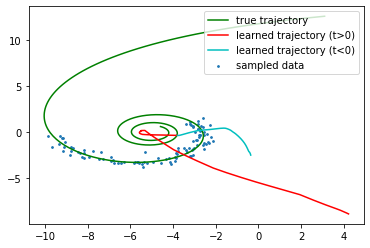

Iter: 770, running avg elbo: -1746.2793


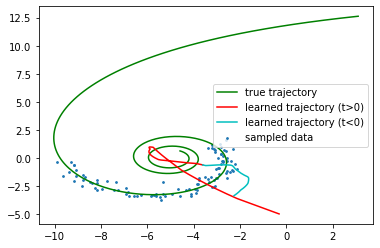

Iter: 780, running avg elbo: -1699.1999


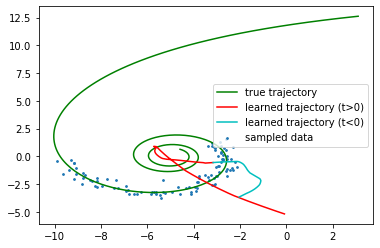

Iter: 790, running avg elbo: -1651.9626


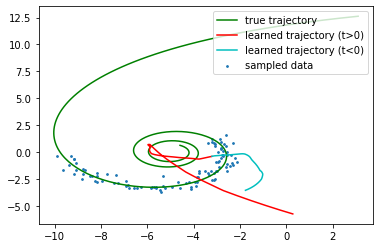

Iter: 800, running avg elbo: -1604.7424


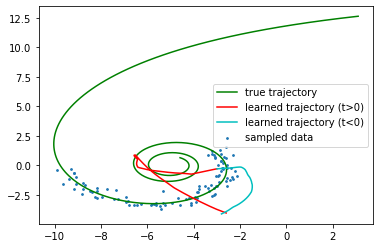

Iter: 810, running avg elbo: -1556.7763


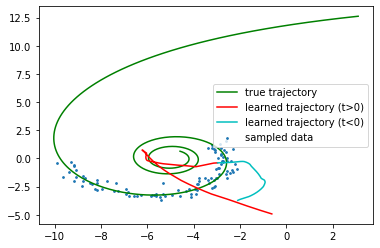

Iter: 820, running avg elbo: -1507.6045


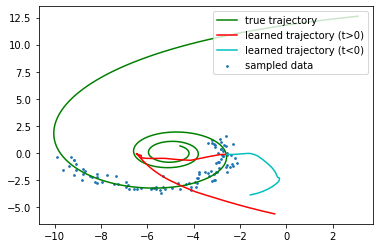

Iter: 830, running avg elbo: -1456.8924


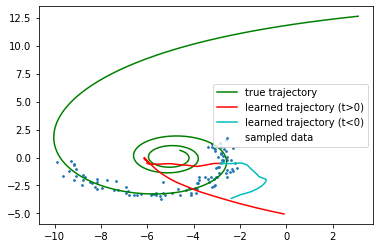

Iter: 840, running avg elbo: -1404.5239


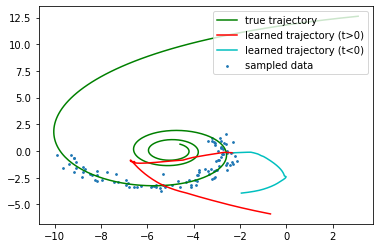

Iter: 850, running avg elbo: -1351.9986


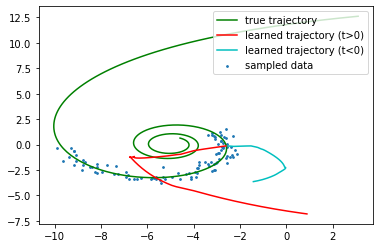

Iter: 860, running avg elbo: -1299.3600


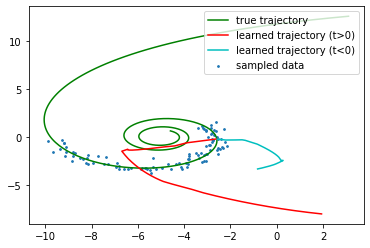

Iter: 870, running avg elbo: -1247.7418


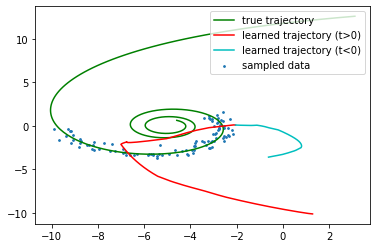

Iter: 880, running avg elbo: -1197.2188


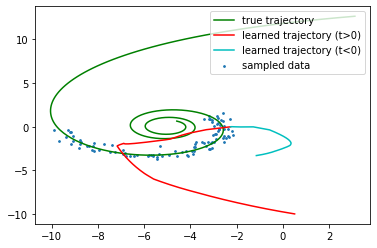

Iter: 890, running avg elbo: -1148.7136


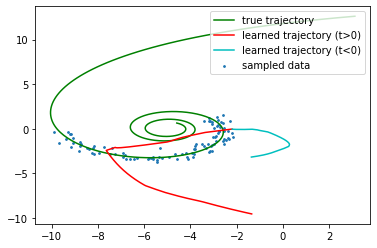

Iter: 900, running avg elbo: -1101.6264


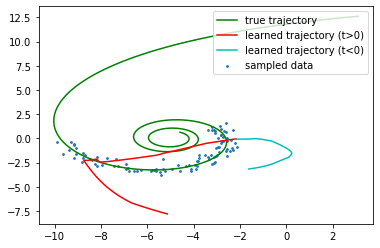

Iter: 910, running avg elbo: -1056.1632


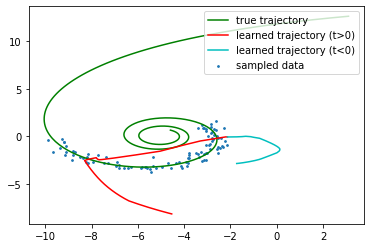

Iter: 920, running avg elbo: -1012.1512


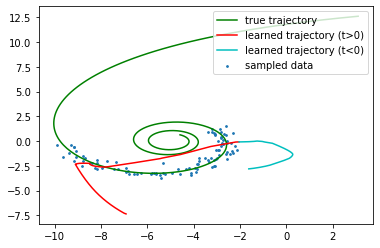

Iter: 930, running avg elbo: -969.8000


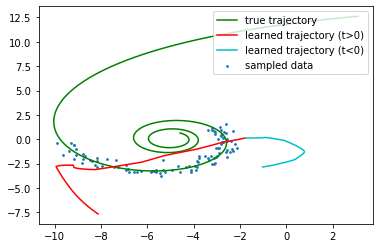

Iter: 940, running avg elbo: -929.3803


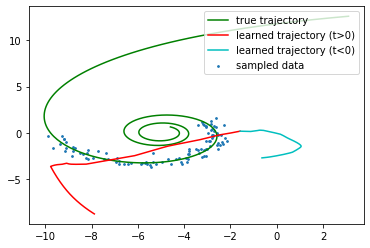

Iter: 950, running avg elbo: -890.5868


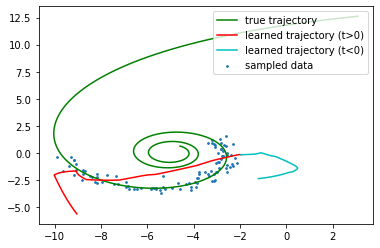

Iter: 960, running avg elbo: -853.5394


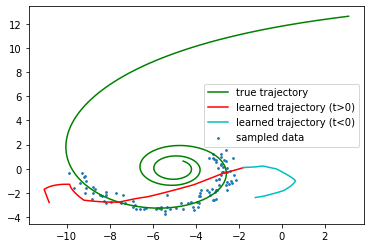

Iter: 970, running avg elbo: -818.1058


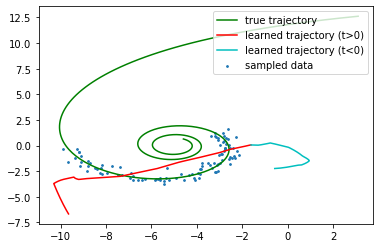

Iter: 980, running avg elbo: -784.3470


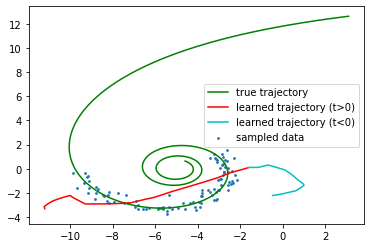

Iter: 990, running avg elbo: -752.2592


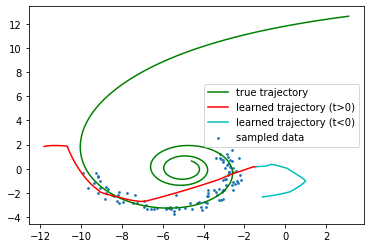

Iter: 1000, running avg elbo: -721.6558


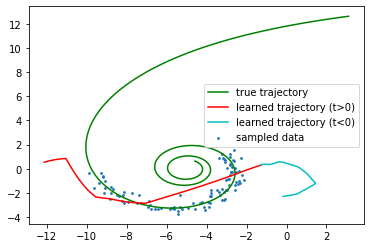

Iter: 1010, running avg elbo: -692.6112


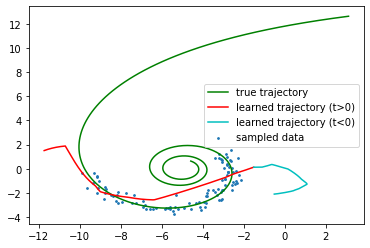

Iter: 1020, running avg elbo: -665.2646


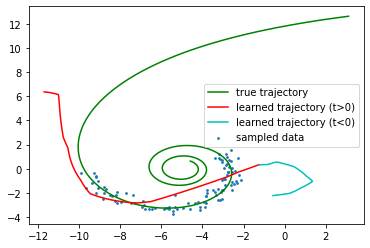

Iter: 1030, running avg elbo: -639.1660


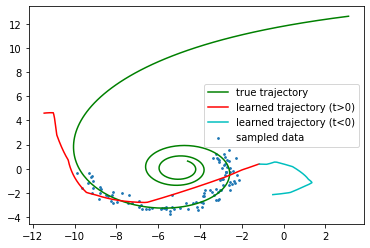

Iter: 1040, running avg elbo: -614.3751


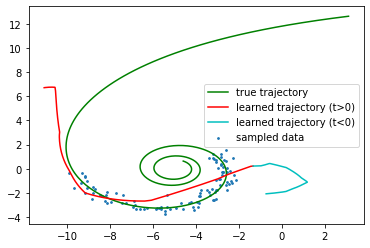

Iter: 1050, running avg elbo: -591.0423


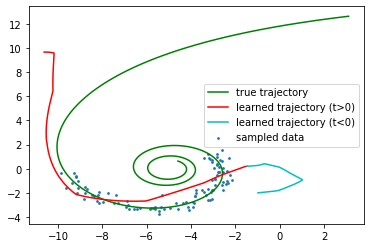

Iter: 1060, running avg elbo: -568.7696


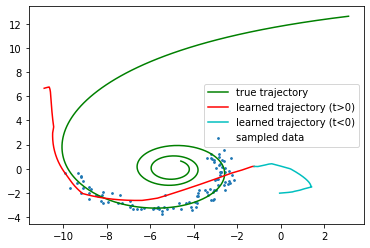

Iter: 1070, running avg elbo: -547.5023


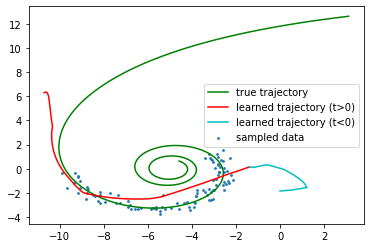

Iter: 1080, running avg elbo: -527.0575


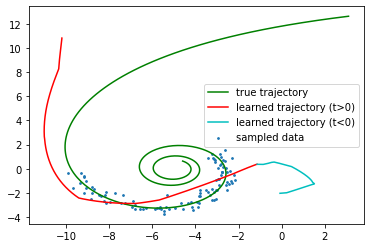

Iter: 1090, running avg elbo: -507.4195


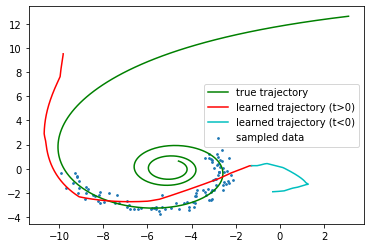

Iter: 1100, running avg elbo: -488.6085


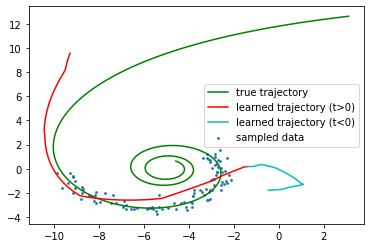

Iter: 1110, running avg elbo: -470.6928


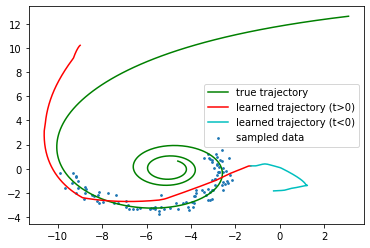

Iter: 1120, running avg elbo: -453.5809


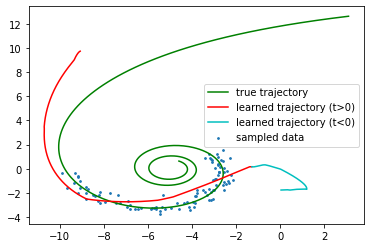

Iter: 1130, running avg elbo: -437.0315


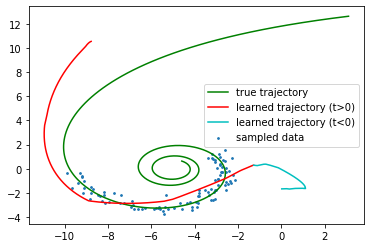

Iter: 1140, running avg elbo: -421.1893


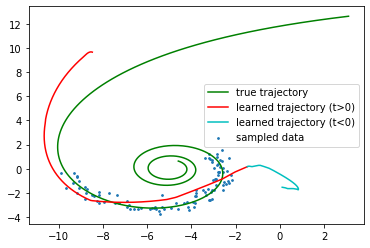

Iter: 1150, running avg elbo: -406.1800


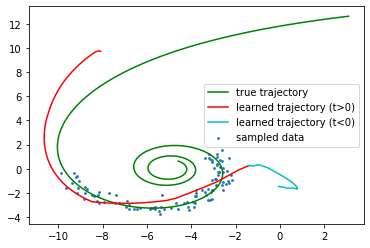

Iter: 1160, running avg elbo: -391.7367


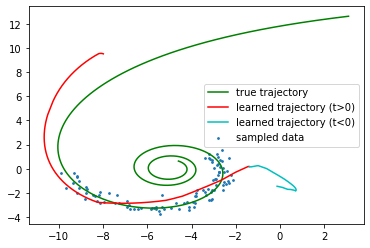

Iter: 1170, running avg elbo: -377.9633


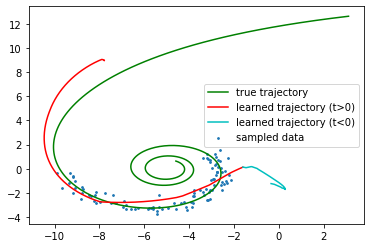

Iter: 1180, running avg elbo: -364.7837


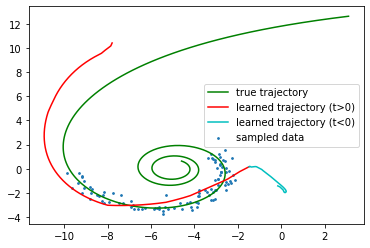

Iter: 1190, running avg elbo: -352.1942


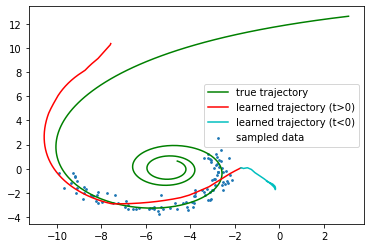

Iter: 1200, running avg elbo: -340.0933


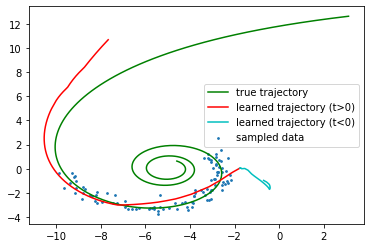

Iter: 1210, running avg elbo: -328.5048


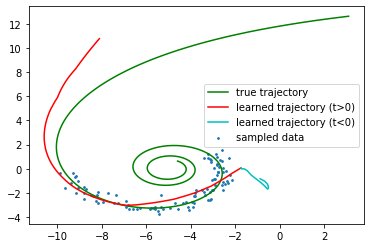

Iter: 1220, running avg elbo: -317.3577


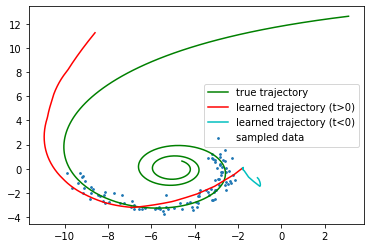

Iter: 1230, running avg elbo: -306.8583


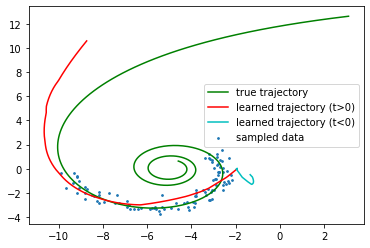

Iter: 1240, running avg elbo: -296.8268


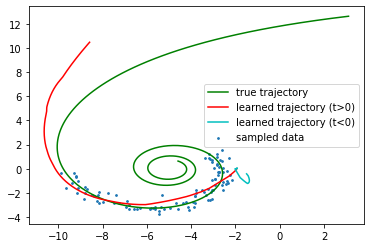

Iter: 1250, running avg elbo: -287.3183


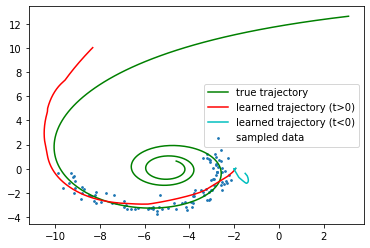

Iter: 1260, running avg elbo: -278.2827


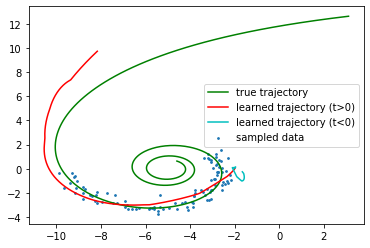

Iter: 1270, running avg elbo: -269.7417


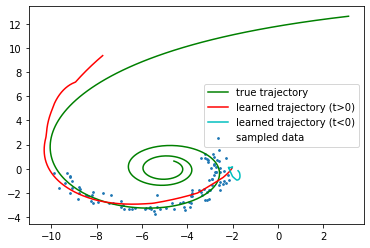

Iter: 1280, running avg elbo: -261.6414


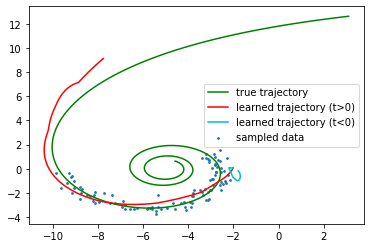

Iter: 1290, running avg elbo: -254.0302


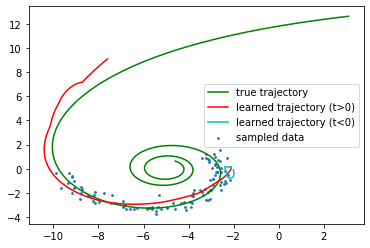

Iter: 1300, running avg elbo: -246.8774


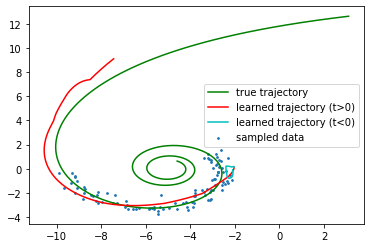

Iter: 1310, running avg elbo: -240.0765


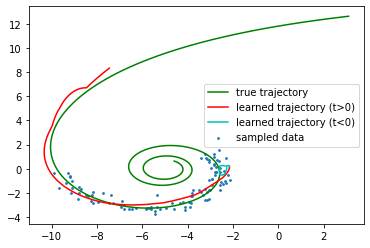

Iter: 1320, running avg elbo: -233.7261


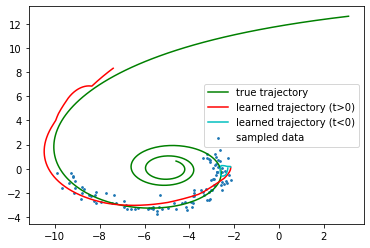

Iter: 1330, running avg elbo: -227.6680


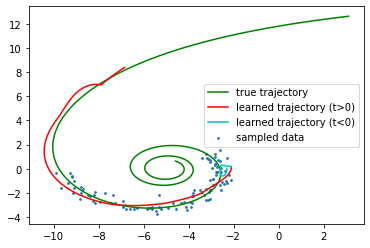

Iter: 1340, running avg elbo: -221.9389


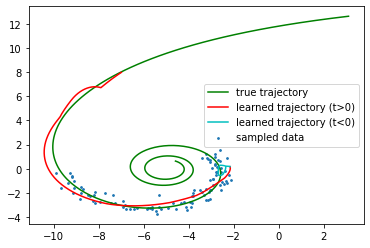

Iter: 1350, running avg elbo: -216.6054


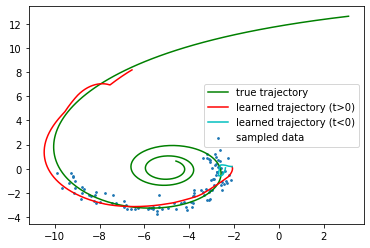

Iter: 1360, running avg elbo: -211.4995


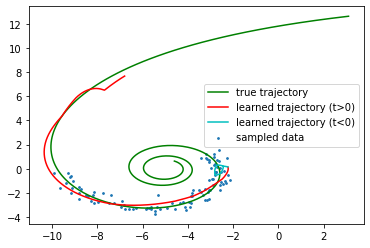

Iter: 1370, running avg elbo: -206.7661


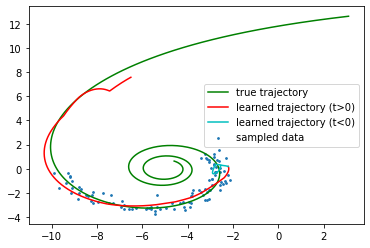

Iter: 1380, running avg elbo: -202.3295


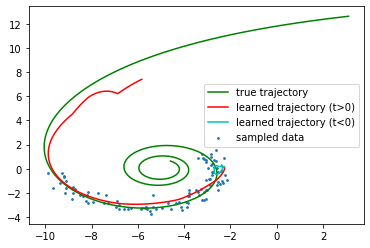

Iter: 1390, running avg elbo: -198.0959


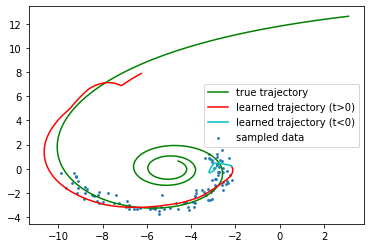

Iter: 1400, running avg elbo: -193.9756


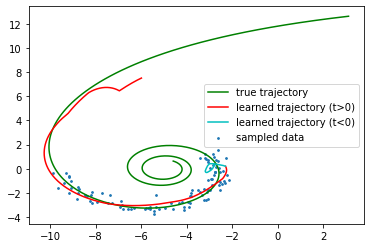

Iter: 1410, running avg elbo: -190.1594


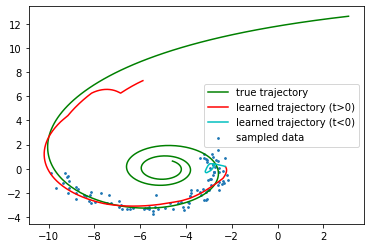

Iter: 1420, running avg elbo: -186.4870


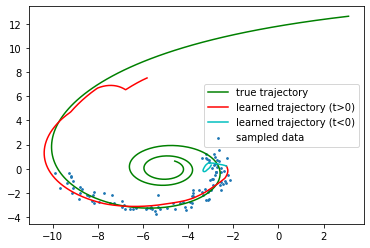

Iter: 1430, running avg elbo: -183.0359


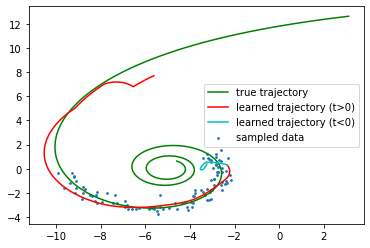

Iter: 1440, running avg elbo: -179.7338


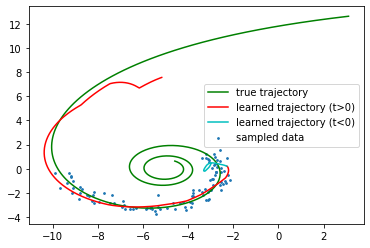

Iter: 1450, running avg elbo: -176.6372


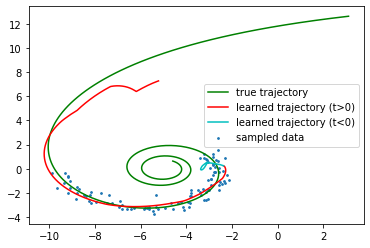

Iter: 1460, running avg elbo: -173.6774


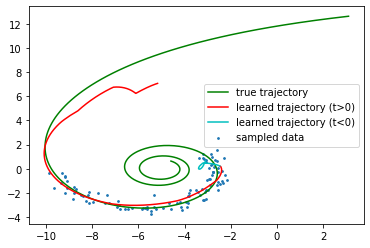

Iter: 1470, running avg elbo: -170.8980


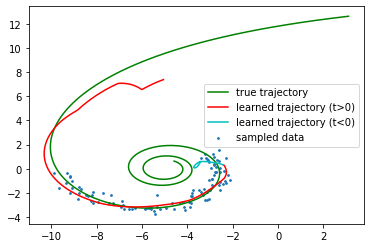

Iter: 1480, running avg elbo: -168.1944


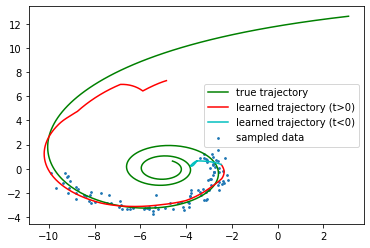

Iter: 1490, running avg elbo: -165.6428


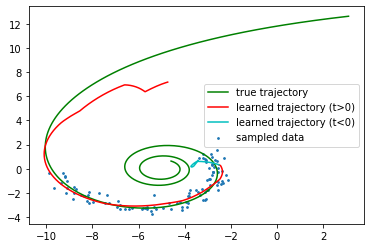

Iter: 1500, running avg elbo: -163.2643


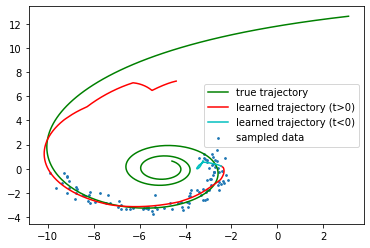

Iter: 1510, running avg elbo: -161.0409


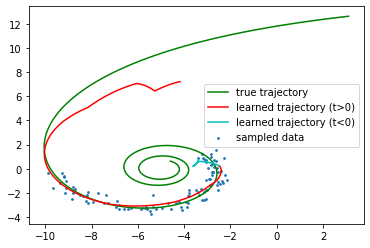

Iter: 1520, running avg elbo: -158.9206


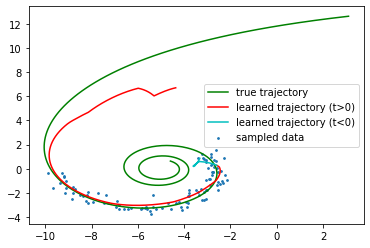

Iter: 1530, running avg elbo: -156.8897


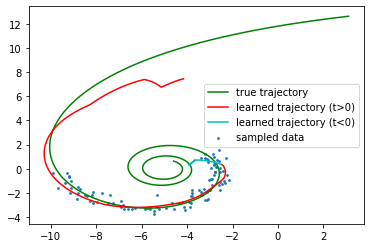

Iter: 1540, running avg elbo: -154.9149


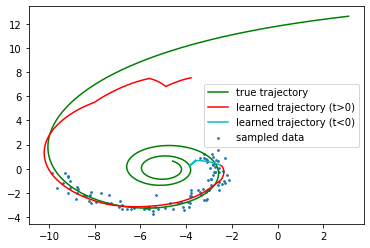

Iter: 1550, running avg elbo: -153.2128


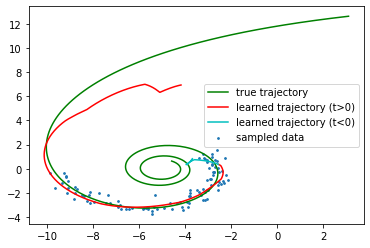

Iter: 1560, running avg elbo: -151.5737


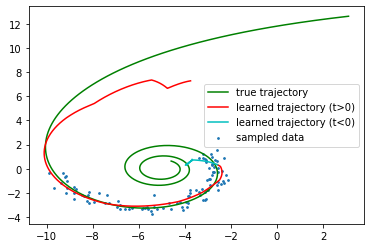

Iter: 1570, running avg elbo: -149.9040


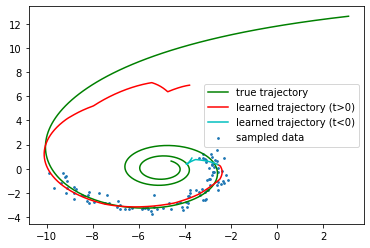

Iter: 1580, running avg elbo: -148.2578


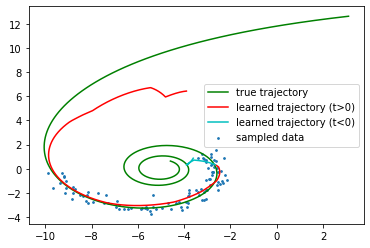

Iter: 1590, running avg elbo: -146.6905


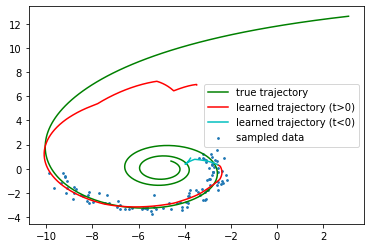

Iter: 1600, running avg elbo: -145.2173


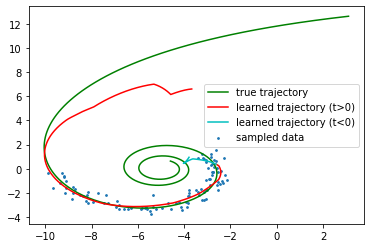

Iter: 1610, running avg elbo: -143.7318


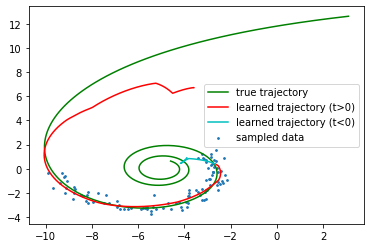

Iter: 1620, running avg elbo: -142.3238


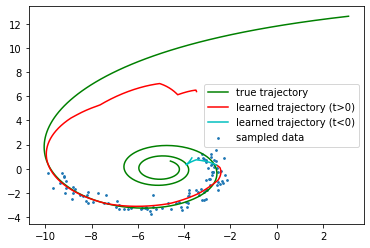

Iter: 1630, running avg elbo: -141.0491


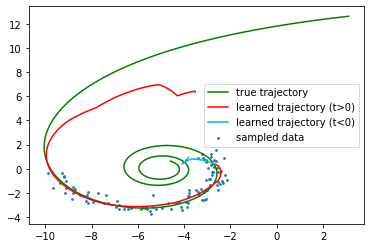

Iter: 1640, running avg elbo: -139.7748


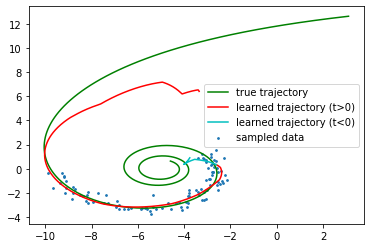

Iter: 1650, running avg elbo: -138.5516


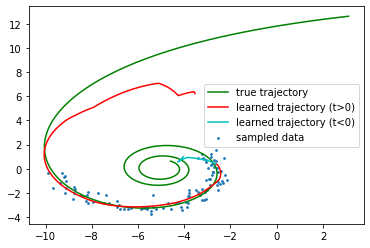

Iter: 1660, running avg elbo: -137.4115


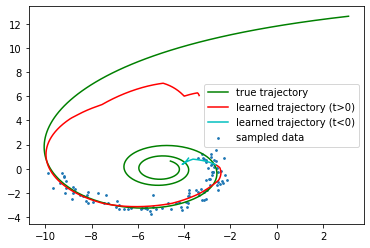

Iter: 1670, running avg elbo: -136.3374


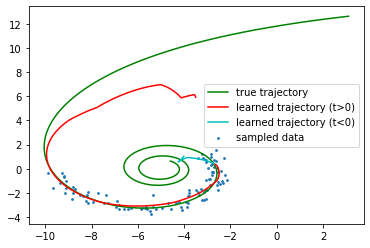

Iter: 1680, running avg elbo: -135.3267


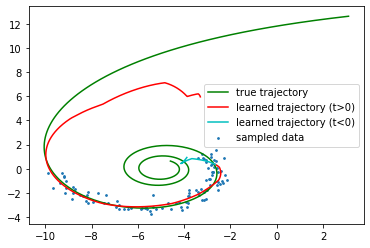

Iter: 1690, running avg elbo: -134.4159


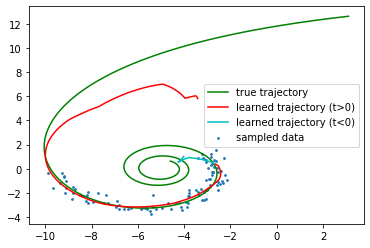

Iter: 1700, running avg elbo: -133.4790


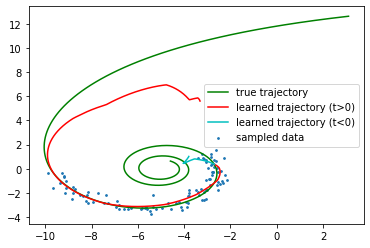

Iter: 1710, running avg elbo: -132.5594


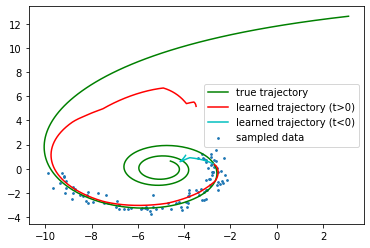

Iter: 1720, running avg elbo: -131.7926


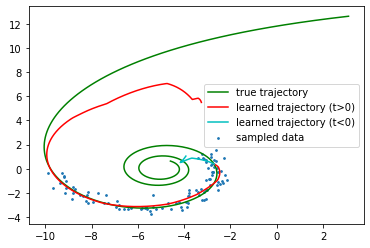

Iter: 1730, running avg elbo: -130.9298


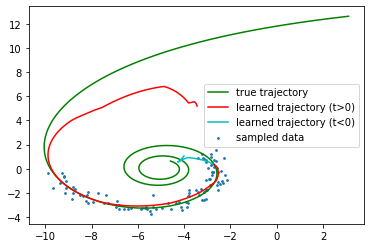

Iter: 1740, running avg elbo: -130.1289


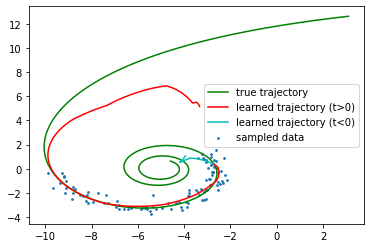

Iter: 1750, running avg elbo: -129.2943


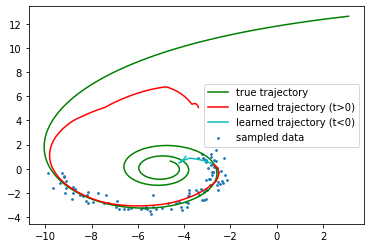

Iter: 1760, running avg elbo: -128.4915


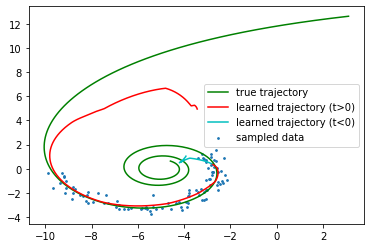

Iter: 1770, running avg elbo: -127.7432


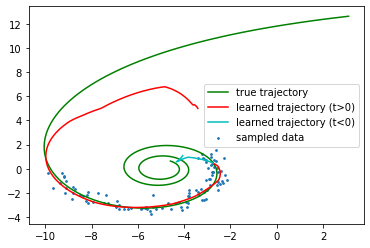

Iter: 1780, running avg elbo: -127.1343


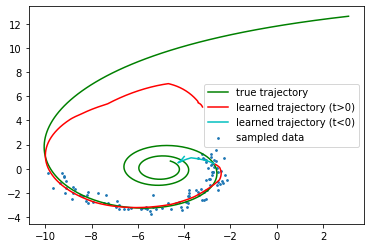

Iter: 1790, running avg elbo: -126.4376


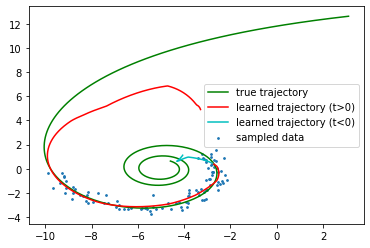

Iter: 1800, running avg elbo: -125.7358


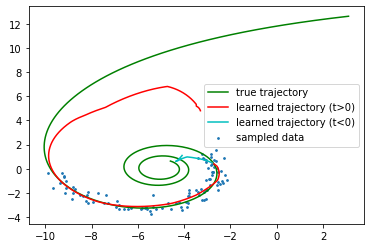

Iter: 1810, running avg elbo: -125.1027


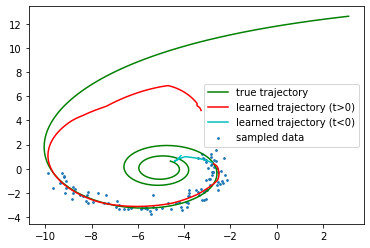

Iter: 1820, running avg elbo: -124.4884


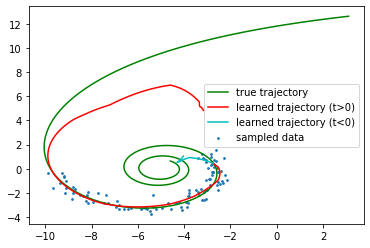

Iter: 1830, running avg elbo: -123.8354


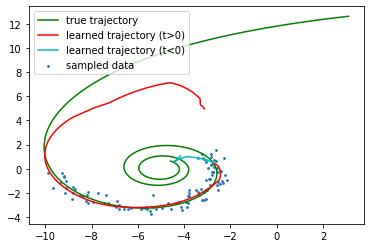

Iter: 1840, running avg elbo: -123.2741


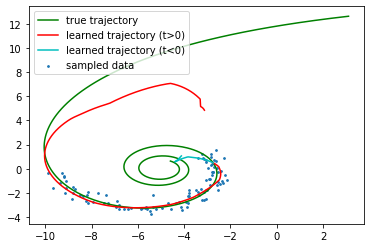

Iter: 1850, running avg elbo: -122.7514


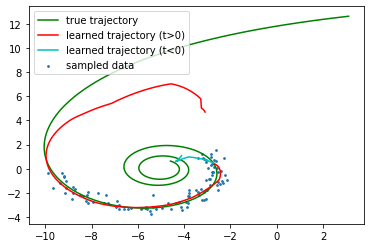

Iter: 1860, running avg elbo: -122.2183


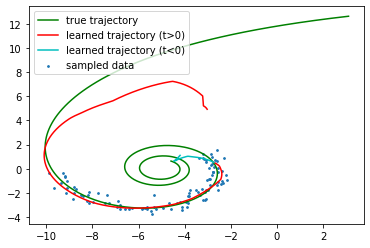

Iter: 1870, running avg elbo: -121.7382


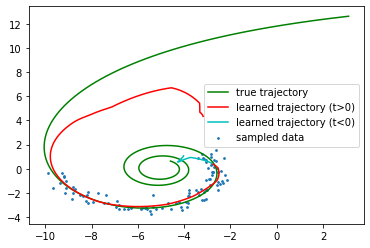

Iter: 1880, running avg elbo: -121.2430


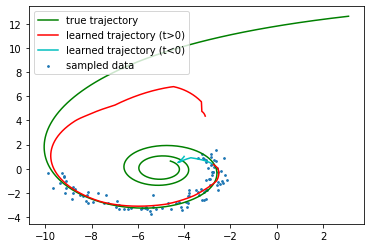

Iter: 1890, running avg elbo: -120.7220


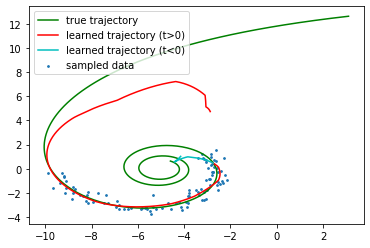

Iter: 1900, running avg elbo: -120.2912


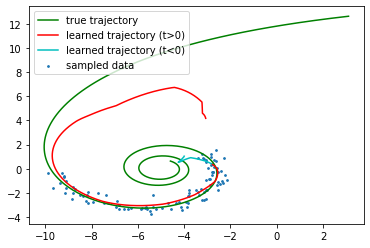

Iter: 1910, running avg elbo: -119.7916


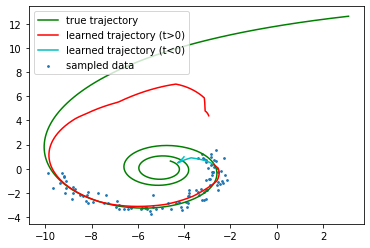

Iter: 1920, running avg elbo: -119.2665


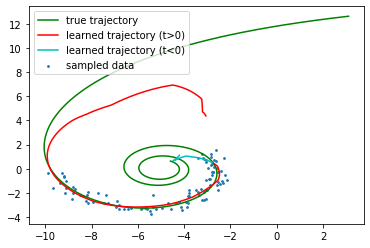

Iter: 1930, running avg elbo: -118.7478


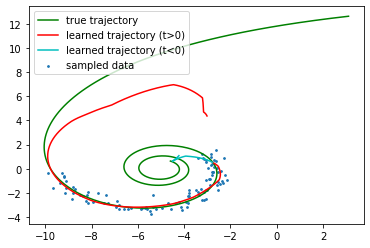

Iter: 1940, running avg elbo: -118.2883


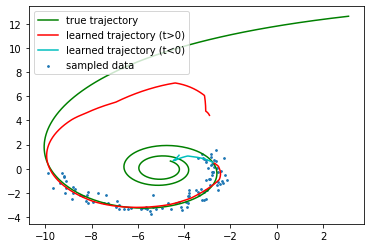

Iter: 1950, running avg elbo: -117.7707


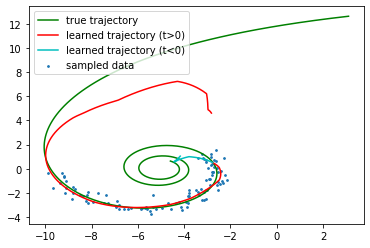

Iter: 1960, running avg elbo: -117.3111


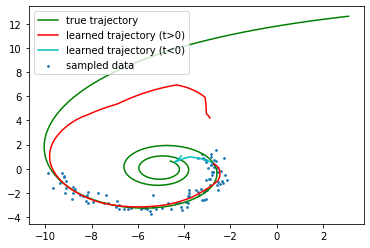

Iter: 1970, running avg elbo: -116.9631


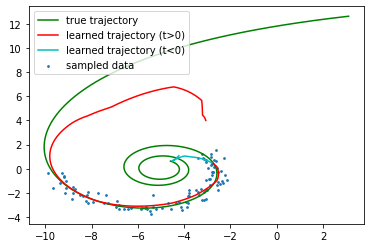

Iter: 1980, running avg elbo: -116.7840


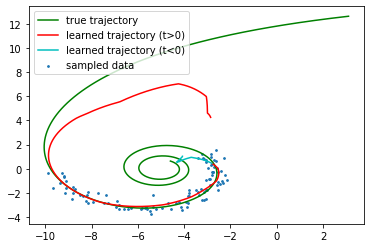

Iter: 1990, running avg elbo: -116.3994


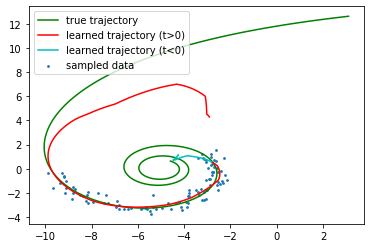

Iter: 2000, running avg elbo: -115.9731


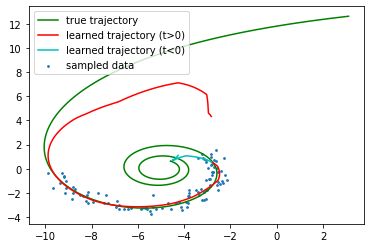

Training complete after 2000 iters.


In [8]:
# Using adjoint backpropagation
from torchdiffeq import odeint_adjoint as odeint

visualize = True
train_dir = './'
n_iters = 2000
opt_lr = 0.001

latent_dim = 4
nhidden = 20
rnn_nhidden = 25
obs_dim = 2
nspiral = 1000
start = 0.
stop = 6 * np.pi
noise_std = .3
a = 0.
b = .3
ntotal = 1000
nsample = 100
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# generate toy spiral data
orig_trajs, samp_trajs, orig_ts, samp_ts = generate_spiral2d(
    nspiral=nspiral,
    start=start,
    stop=stop,
    noise_std=noise_std,
    a=a, b=b
)
orig_trajs = torch.from_numpy(orig_trajs).float().to(device)
samp_trajs = torch.from_numpy(samp_trajs).float().to(device)
samp_ts = torch.from_numpy(samp_ts).float().to(device)

# model
func = LatentODEfunc(latent_dim, nhidden).to(device)
rec = RecognitionRNN(latent_dim, obs_dim, rnn_nhidden, nspiral).to(device)
dec = Decoder(latent_dim, obs_dim, nhidden).to(device)
params = (list(func.parameters()) + list(dec.parameters()) + list(rec.parameters()))
optimizer = optim.Adam(params, lr=opt_lr)
loss_meter = RunningAverageMeter()

if train_dir is not None:
    if not os.path.exists(train_dir):
        os.makedirs(train_dir)
    ckpt_path = os.path.join(train_dir, 'ckpt_2ds_nodeadj.pth')
    if os.path.exists(ckpt_path):
        checkpoint = torch.load(ckpt_path)
        func.load_state_dict(checkpoint['func_state_dict'])
        rec.load_state_dict(checkpoint['rec_state_dict'])
        dec.load_state_dict(checkpoint['dec_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        orig_trajs = checkpoint['orig_trajs']
        samp_trajs = checkpoint['samp_trajs']
        orig_ts = checkpoint['orig_ts']
        samp_ts = checkpoint['samp_ts']
        print('Loaded ckpt from {}'.format(ckpt_path))

try:
    for itr in range(1, n_iters + 1):
        optimizer.zero_grad()
        # backward in time to infer q(z_0)
        h = rec.initHidden().to(device)
        for t in reversed(range(samp_trajs.size(1))):
            obs = samp_trajs[:, t, :]
            out, h = rec.forward(obs, h)
        qz0_mean, qz0_logvar = out[:, :latent_dim], out[:, latent_dim:]
        epsilon = torch.randn(qz0_mean.size()).to(device)
        z0 = epsilon * torch.exp(.5 * qz0_logvar) + qz0_mean

        # forward in time and solve ode for reconstructions
        pred_z = odeint(func, z0, samp_ts).permute(1, 0, 2)
        pred_x = dec(pred_z)

        # compute loss
        noise_std_ = torch.zeros(pred_x.size()).to(device) + noise_std
        noise_logvar = 2. * torch.log(noise_std_).to(device)
        logpx = log_normal_pdf(
            samp_trajs, pred_x, noise_logvar).sum(-1).sum(-1)
        pz0_mean = pz0_logvar = torch.zeros(z0.size()).to(device)
        analytic_kl = normal_kl(qz0_mean, qz0_logvar,
                                pz0_mean, pz0_logvar).sum(-1)
        loss = torch.mean(-logpx + analytic_kl, dim=0)
        loss.backward()
        optimizer.step()
        loss_meter.update(loss.item())

        if itr % 10 == 0:
            print('Iter: {}, running avg elbo: {:.4f}'.format(itr, -loss_meter.avg))

            if visualize:
                with torch.no_grad():
                    # sample from trajectorys' approx. posterior
                    h = rec.initHidden().to(device)
                    for t in reversed(range(samp_trajs.size(1))):
                        obs = samp_trajs[:, t, :]
                        out, h = rec.forward(obs, h)
                    qz0_mean, qz0_logvar = out[:, :latent_dim], out[:, latent_dim:]
                    epsilon = torch.randn(qz0_mean.size()).to(device)
                    z0 = epsilon * torch.exp(.5 * qz0_logvar) + qz0_mean
                    if isinstance(orig_ts, np.ndarray):
                        orig_ts = torch.from_numpy(orig_ts).float().to(device)

                    # take first trajectory for visualization
                    z0 = z0[0]

                    ts_pos = np.linspace(0., 2. * np.pi, num=2000)
                    ts_neg = np.linspace(-np.pi, 0., num=2000)[::-1].copy()
                    ts_pos = torch.from_numpy(ts_pos).float().to(device)
                    ts_neg = torch.from_numpy(ts_neg).float().to(device)

                    zs_pos = odeint(func, z0, ts_pos)
                    zs_neg = odeint(func, z0, ts_neg)

                    xs_pos = dec(zs_pos)
                    xs_neg = torch.flip(dec(zs_neg), dims=[0])

                xs_pos = xs_pos.cpu().numpy()
                xs_neg = xs_neg.cpu().numpy()
                orig_traj = orig_trajs[0].cpu().numpy()
                samp_traj = samp_trajs[0].cpu().numpy()

                plt.figure()
                plt.plot(orig_traj[:, 0], orig_traj[:, 1],
                         'g', label='true trajectory')
                plt.plot(xs_pos[:, 0], xs_pos[:, 1], 'r',
                         label='learned trajectory (t>0)')
                plt.plot(xs_neg[:, 0], xs_neg[:, 1], 'c',
                         label='learned trajectory (t<0)')
                plt.scatter(samp_traj[:, 0], samp_traj[
                            :, 1], label='sampled data', s=3)
                plt.legend()
                plt.show()

except KeyboardInterrupt:
    if train_dir is not None:
        ckpt_path = os.path.join(train_dir, 'ckpt_2ds_nodeadj.pth')
        torch.save({
            'func_state_dict': func.state_dict(),
            'rec_state_dict': rec.state_dict(),
            'dec_state_dict': dec.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'orig_trajs': orig_trajs,
            'samp_trajs': samp_trajs,
            'orig_ts': orig_ts,
            'samp_ts': samp_ts,
        }, ckpt_path)
        print('Stored ckpt at {}'.format(ckpt_path))
print('Training complete after {} iters.'.format(itr))

plt.close('all')